In [1]:
from datetime import datetime
import json, pickle
import timeit, random, lzma
import gzip, os, csv
from collections import defaultdict, Counter

def read_json_list(input_file):
    with gzip.open(input_file) if input_file.endswith(".gz") \
            else open(input_file) as fin:
        for line in fin:
            obj = json.loads(line)
            yield obj


In [2]:
# from build_user_subreddit_history import read_json_list
from collections import defaultdict, Counter
from sklearn.feature_extraction.text import TfidfVectorizer
import spacy
from networkx.algorithms import bipartite
import networkx as nx
import random
from community import community_louvain
import matplotlib.cm as cm
from datetime import datetime
from datetime import date
import datetime as dt
import seaborn as sns
import pandas as pd
import numpy as np
from scipy import stats

In [3]:
nlp = spacy.load('en_core_web_sm')

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
%cd /content/drive/My Drive/Colab Notebooks/MACS 37000/new_data

/content/drive/My Drive/Colab Notebooks/MACS 37000/new_data


### Load the comments and posts from the Reddit

In [6]:
# select variables that I want related to the posts: content, time, author, title, subreddit
def get_comments(sub):
    
    result_dic = {}
    
    filename = "{1}/{0}/{1}_jsonlists.gz".format(sub, 'comments')
    
    i = 0
    
    for dic in read_json_list(filename):
      result = {}
      if 'body' in dic:
        if len(dic['body'].split()) > 20:
          result["topic_link"] = dic['permalink']
          result["author"] = dic['author']
#                 result["author_fullname"] = dic['author_fullname']
          result["comments"] = dic['body']
          result["lind_id"] = dic['link_id']
          result["parent_id"] = dic['parent_id']
          result_dic[i] = result
          i += 1
    print(i)
    return result_dic

In [7]:
wfh_comments = get_comments('WorkFromHome')#2021 

7042


In [8]:
wfh_comments

{0: {'author': 'square-head-14',
  'comments': 'You are so right! This limiting and turning off is really the hardest thing to do for me too, thankfully I\'ve got a good employer and boss that understands that I should just continue tomorrow. It\'s myself that\'s my biggest enemy in "just checking one more thing" and that 5 minutes eating up 15mins or more! Building the habit of being strict is something I\'m still working on myself',
  'lind_id': 't3_r6uu9m',
  'parent_id': 't1_hmxc1ec',
  'topic_link': '/r/workfromhome/comments/r6uu9m/work_from_home_burnout/hqlljle/'},
 1: {'author': 'square-head-14',
  'comments': "The original comment is deleted, but I have a Phillips Somneo wake up light, and when I actually use it properly it definitely helps me. It is a bit expensive, and I don't really use all the features it has, but I don't have any buyers regret from it. I'd likely try others in the Phillips brand because of my experience with this one if I ever get another",
  'lind_id': 't

In [9]:
# select variables that I want related to the posts: content, time, author, title, subreddit
def get_contents(sub):
    
    result_dic = {}
    
    filename = "{1}/{0}/{1}_jsonlists.gz".format(sub, 'posts')
    
    i = 0
    
    for dic in read_json_list(filename):
            result = {}
            if 'selftext' in dic:
                title = dic['title']
                text = dic['selftext']
                subreddit = dic['subreddit']
                created_time = dic['created_utc']   
                if text != '[removed]'and text !='[deleted]':
                    result['permalink'] = dic['permalink']
                    result["author"] = dic['author']
                    result['text'] = title+' '+text 
                    result['time'] = datetime.utcfromtimestamp(created_time).strftime('%Y-%m-%d %H:%M:%S')
                    result['date'] = result['time'][:10]
                    result_dic[i] = result
                    i += 1
    print(i)
    return result_dic

In [10]:
wfh_posts = get_contents('WorkFromHome21')

3016


In [11]:
wfh_posts

{0: {'author': 'Ramysue',
  'date': '2021-12-30',
  'permalink': '/r/workfromhome/comments/rsckud/team_building_while_working_from_home/',
  'text': 'Team building while working from home. Looking for advice on how to team build while working from home.\nWe used to be in the office working together (team of about 10) and have lost the team feel since we all are now wfh. We work in healthcare, so a very stressed out group too.\nThanks in advance for any advice.',
  'time': '2021-12-30 21:22:22'},
 1: {'author': 'duganaok',
  'date': '2021-12-30',
  'permalink': '/r/workfromhome/comments/rs7hqg/working_from_home_is_the_best_life/',
  'text': 'Working from home is the best life. So I’ve been working from home since the start of the pandemic and I lucked out because they transitioned my position to be permanent work from home. I’m also allowed to work from home in nearly every state.\n\nSo I have started traveling and working in other locations. I spent thanksgiving with my parents over 12

In [12]:
dic_all = {}
for k1,v1 in wfh_posts.items():
    num_comments = 0
    for k2,v2 in wfh_comments.items():
        if v1['permalink'] in v2['topic_link']:
            if v1['permalink'] not in dic_all.keys():
                dic_all[v1['permalink']] = {}
            dic_all[v1['permalink']]['post author'] = v1['author']
            dic_all[v1['permalink']]['texts'] = v1['text']
            if 'comments author' not in dic_all[v1['permalink']].keys():
                dic_all[v1['permalink']]['comments author'] = []
            num_comments += 1
            dic_all[v1['permalink']]['num comments'] = num_comments
            if v2['author'] != '[deleted]':
                dic_all[v1['permalink']]['comments author'].append(v2['author'])
            

In [13]:
dic_all

{'/r/workfromhome/comments/rs7hqg/working_from_home_is_the_best_life/': {'comments author': ['Teeshirtallday',
   'Fili_Di',
   'KidBeene',
   'luv2lerk',
   'duganaok',
   'StrengthObjective',
   'SamiHami24'],
  'num comments': 7,
  'post author': 'duganaok',
  'texts': 'Working from home is the best life. So I’ve been working from home since the start of the pandemic and I lucked out because they transitioned my position to be permanent work from home. I’m also allowed to work from home in nearly every state.\n\nSo I have started traveling and working in other locations. I spent thanksgiving with my parents over 1200 miles away and used absolutely no PTO. So I can spend time with them, and save my PTO for like real vacations.\n\nThings I am so glad to be living without.\n\nFucking commuting and traffic.\n\nI do miss that in the slightest and I can’t believe how much time is wasted by having to go into an office. I literally have 2.5 extra hours a day to myself just from not having t

### Graph for large network

In [14]:
import networkx as nx
import decorator
import matplotlib.pyplot as plt
%matplotlib inline


In [15]:
my_graph = nx.Graph()
for k,v in dic_all.items():
  for c in set(v['comments author']):
    if c != v['post author']:
      my_graph.add_edge(c,v['post author'])
# nx.draw(my_graph, with_labels=True)

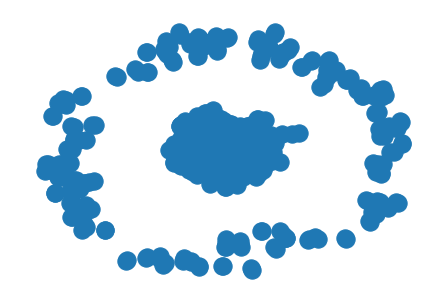

In [ ]:
# nx.draw(my_graph, with_labels=False)

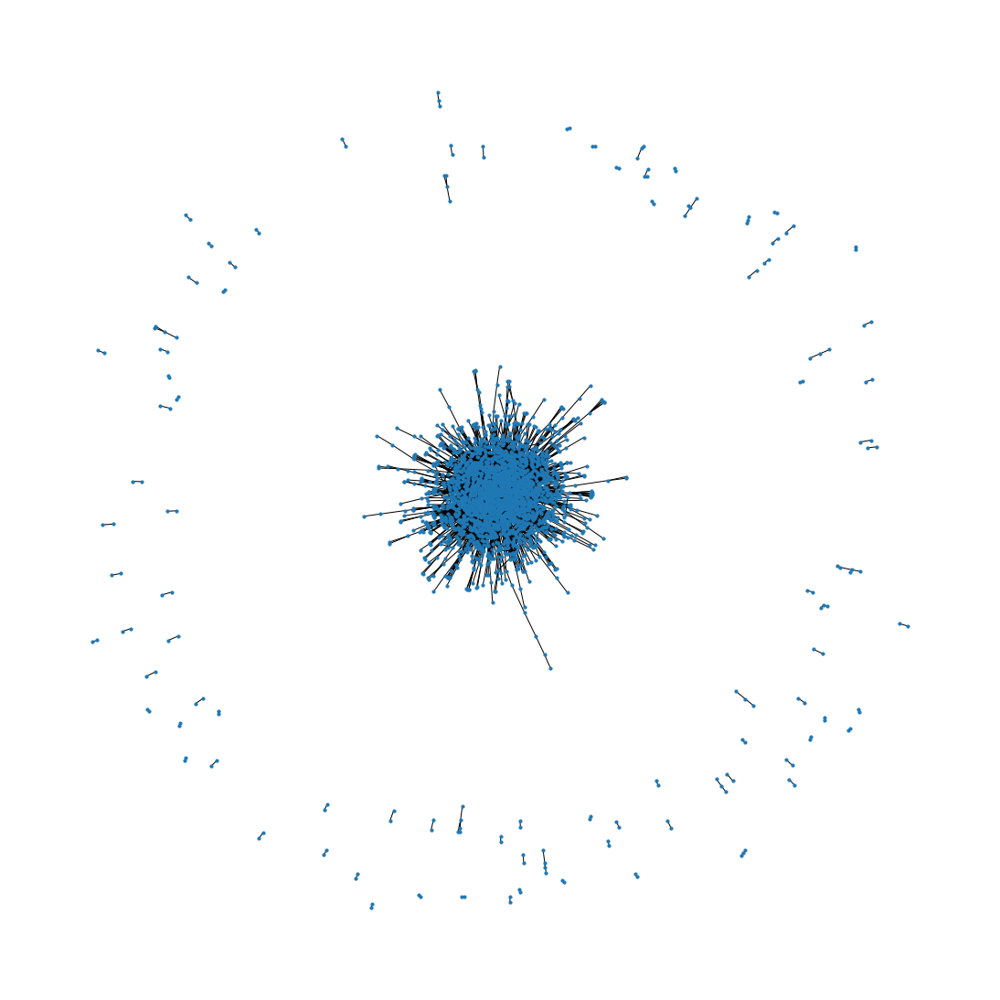

In [16]:
plt.figure(figsize=(15,15)) 
nx.draw(my_graph, with_labels=False,node_size=10)
plt.show()

In [17]:
my_graph.number_of_nodes()

2745

In [18]:
remove = [node for node,degree in dict(my_graph.degree()).items() if degree <= 4]

In [19]:
len(remove)

2196

In [20]:
my_graph.remove_nodes_from(remove)

In [21]:
my_graph.number_of_nodes()

549

In [22]:
remove = [node for node,degree in dict(my_graph.degree()).items() if degree <= 1]

In [23]:
len(remove)

19

In [24]:
my_graph.remove_nodes_from(remove)

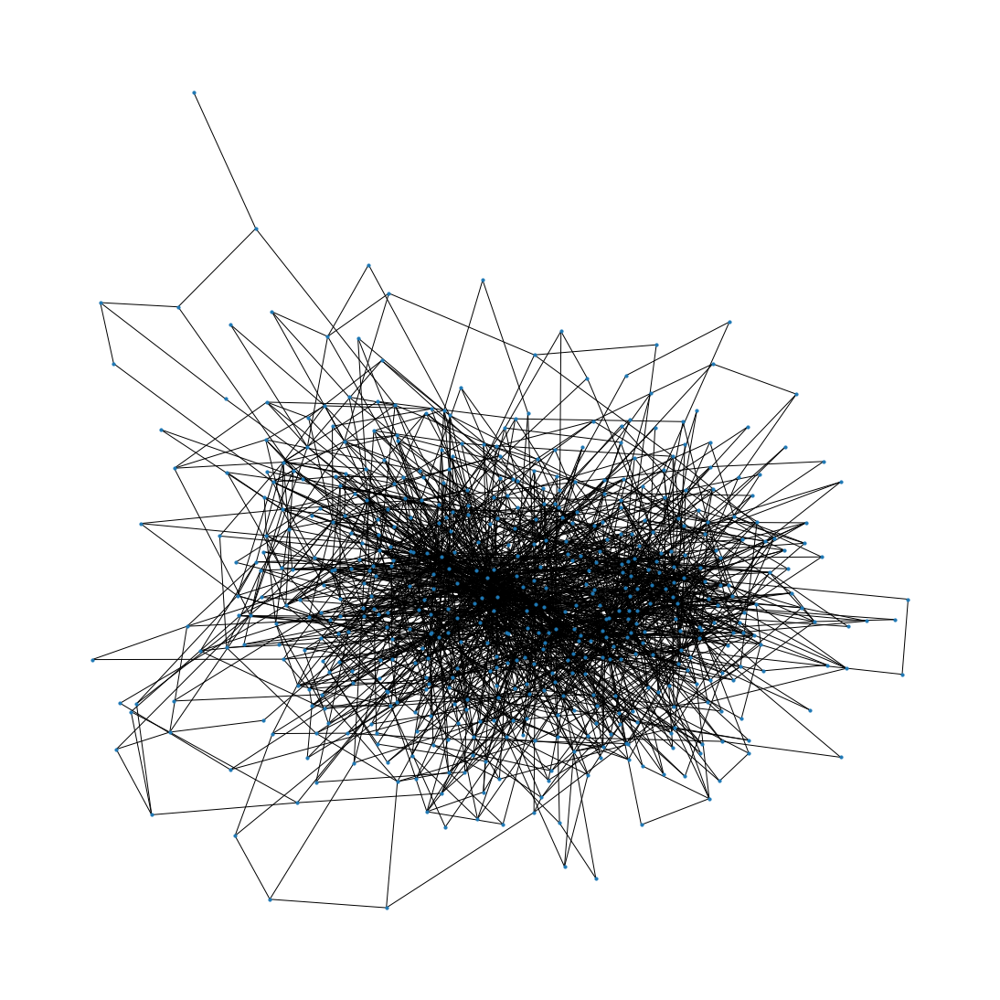

In [25]:
plt.figure(figsize=(15,15)) 
nx.draw(my_graph, with_labels=False,node_size=10)
plt.show()

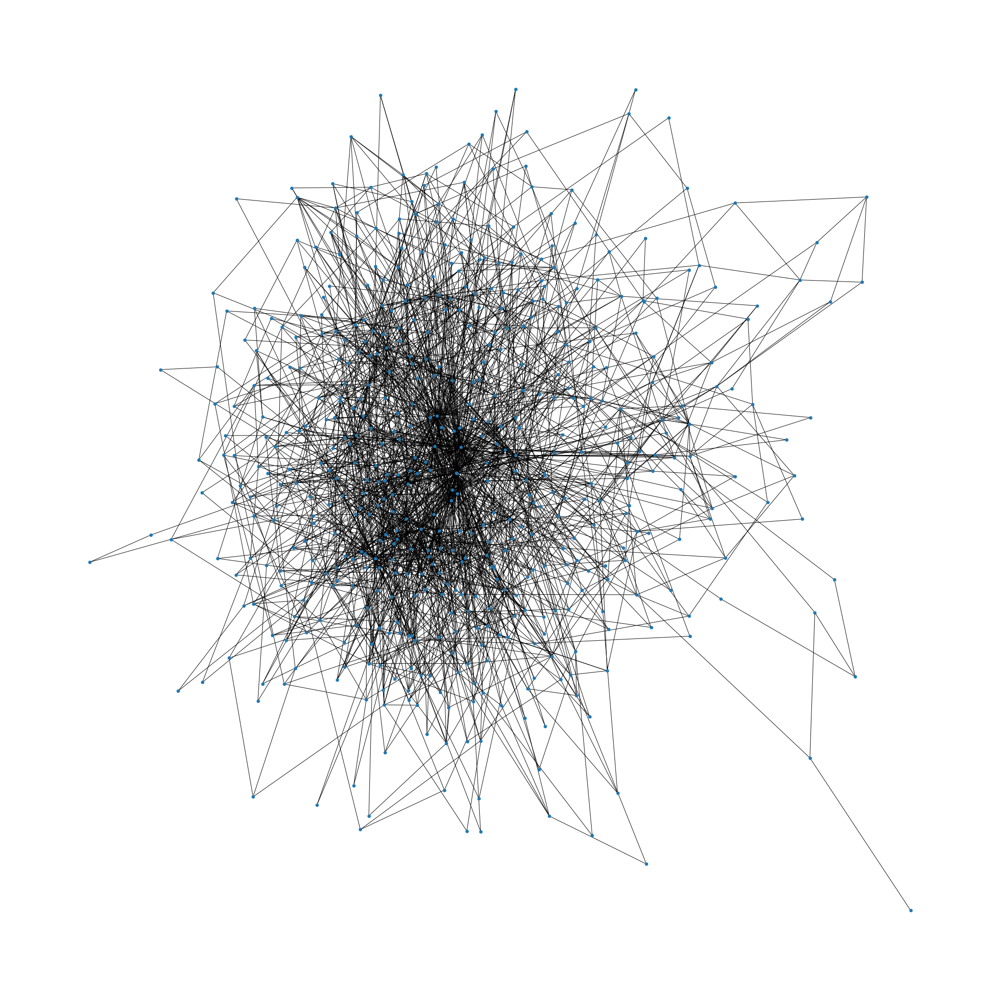

In [26]:
plt.figure(figsize=(30,30)) 
nx.draw(my_graph, with_labels=False,node_size=40)
plt.show()

In [27]:
len(my_graph.nodes)

530

### Features of the graph

In [28]:
# Plot the degree distribution again.
from collections import Counter
import numpy as np

def plot_degree_dist(G, title):
    degrees = list(dict(nx.degree(G)).values())
    degree_counts = Counter(degrees)
    
    p_k = [(degree, count / len(G.nodes()))
               for degree, count in degree_counts.items()]
    p_k = sorted(p_k)
    
    plt.xlabel('$k$')
    plt.ylabel('$P(k)$')
    
    x_degree = [x[0] for x in p_k]
    
    plt.bar(x_degree, [x[1] for x in p_k], align='center', alpha=0.4)
    
    plt.locator_params(nbins=10) 
    plt.title('Degree Distribution for %s (mean=%.2f, N=%d)' 
               % (title, np.mean(degrees), len(G.nodes())))
    

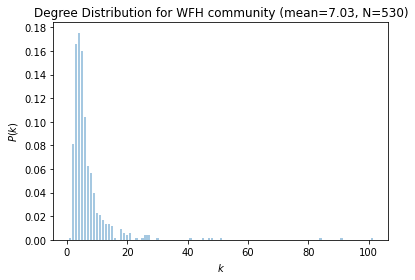

In [29]:
plot_degree_dist(my_graph, 'WFH community')

In [30]:
def plot_clustering_dist(G, title):
    clustering_coef = list(nx.clustering(G).values())
    plt.hist(list(clustering_coef), alpha=0.4, bins=20)
    plt.xlabel('$C$(clustering coefficient)')
    plt.ylabel('#nodes')
    plt.title('Clustering Coefficient for %s (mean=%.2f)' % 
                          (title, np.mean(clustering_coef)))

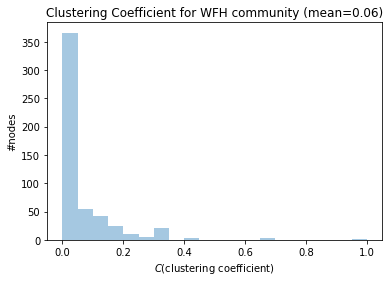

In [31]:
# clustering coefficient for real coauthor network
plot_clustering_dist(my_graph, 'WFH community')

In [32]:
def get_shortest_paths(G):
    # Takes a while
    #Computes the shortest path lengths between every pair of nodes in `G`
    node_path = nx.all_pairs_shortest_path_length(G)
    # a list of average shortest path between each node and all nodes
    return [np.mean(list(paths.values()))
                    for paths in dict(node_path).values()]

In [33]:
def plot_shortest_paths_dist(G, title):
    avg_spath_len = get_shortest_paths(G) # a list of avg shorted path
    plt.hist(avg_spath_len, alpha=0.4)
    plt.xlabel('avg. shortest path')
    plt.ylabel('count')
    plt.title('Shortest Paths for %s (mean=%.2f)' 
                       % (title, np.mean(avg_spath_len)))

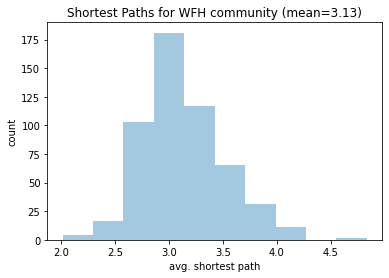

In [34]:
plot_shortest_paths_dist(my_graph, 'WFH community')

In [35]:
nx.edge_betweenness_centrality(my_graph, normalized=True)

{('SamiHami24', 'duganaok'): 0.00045169410085659515,
 ('SamiHami24', 'anacid99'): 0.0009608135188523104,
 ('SamiHami24', 'dirtyashtray'): 0.0038830206305894735,
 ('SamiHami24', 'm4RLA5INGER'): 0.0011232015651364878,
 ('duganaok', 'KidBeene'): 0.0035639350868426943,
 ('KidBeene', 'JohnnyJockomoco'): 0.0009435746854315315,
 ('KidBeene', 'Advi0001'): 0.0007191891923588489,
 ('KidBeene', 'LincHayes'): 0.0035224046235506246,
 ('KidBeene', 'turtlewinstherace'): 0.0006380642690215721,
 ('KidBeene', 'Realistic_Yogurt_950'): 0.0010093291920235785,
 ('KidBeene', 'shellzshawtee94'): 0.0008983980733726339,
 ('KidBeene', 'whitlow_running'): 0.0004562468890559985,
 ('KidBeene', 'ArdascesIV'): 0.0004462541707610586,
 ('KidBeene', 'beanston'): 0.0006820678931612696,
 ('KidBeene', 'TeamChanty'): 0.0004666114450480521,
 ('KidBeene', 'krissyface'): 0.004289685685221797,
 ('Username_of_Chaos', 'activistss'): 0.0005520759886428483,
 ('Username_of_Chaos', 'Ph03n1x_5'): 0.0009112140133534703,
 ('Username_of_

### Eigen vectors (old method)

In [36]:
from numpy.linalg import eigh

In [37]:
def adjacency_matrix(graph):
    return nx.adjacency_matrix(graph, sorted(graph.nodes()))

adjacency = adjacency_matrix(my_graph)

In [38]:
import numpy as np

def degree_matrix(graph):
    degrees = dict(graph.degree()).items() # {node: degree}
    # a list of {node: degree}, sorted by key
    degrees = sorted(degrees, key=lambda x: x[0]) 
    degrees = [d[1] for d in degrees] 
    return np.diag(degrees)

degree = degree_matrix(my_graph)

In [39]:
def laplacian_matrix(graph):
    return degree_matrix(graph) - adjacency_matrix(graph)

laplacian = laplacian_matrix(my_graph)

In [40]:
eig_vals, eig_vectors = eigh(laplacian)
# round them for prettier printing
eig_vals = np.round(eig_vals, 2)
eig_vectors = np.round(eig_vectors, 2)
print('eigen values\n', eig_vals) #increase order
print('eigen vectors\n',np.round(eig_vectors, 2)) #have already normalized by l2 norm
# matmul(A,v)=lambda*v

eigen values
 [  0.     0.43   0.74   0.78   0.83   0.95   1.     1.07   1.08   1.12
   1.23   1.25   1.27   1.29   1.3    1.32   1.37   1.38   1.39   1.4
   1.43   1.45   1.45   1.5    1.51   1.55   1.59   1.6    1.62   1.62
   1.63   1.64   1.66   1.66   1.68   1.69   1.69   1.7    1.72   1.74
   1.75   1.76   1.77   1.78   1.78   1.79   1.8    1.82   1.82   1.84
   1.84   1.85   1.87   1.87   1.88   1.9    1.9    1.91   1.92   1.93
   1.94   1.94   1.95   1.96   1.98   1.99   2.     2.01   2.03   2.04
   2.05   2.08   2.08   2.09   2.12   2.12   2.14   2.16   2.17   2.18
   2.21   2.22   2.23   2.25   2.26   2.3    2.32   2.34   2.35   2.38
   2.4    2.41   2.43   2.44   2.44   2.46   2.47   2.48   2.5    2.51
   2.52   2.54   2.56   2.57   2.59   2.6    2.61   2.63   2.64   2.65
   2.67   2.67   2.7    2.7    2.71   2.73   2.74   2.76   2.77   2.77
   2.78   2.79   2.81   2.81   2.81   2.83   2.85   2.85   2.85   2.86
   2.87   2.89   2.9    2.9    2.92   2.93   2.94   2.95   2.95 

SamiHami24 0.0 -0.01
duganaok -0.0 -0.01
KidBeene 0.0 -0.02
Username_of_Chaos 0.0 -0.0
LincHayes 0.0 0.07
Vyce223 -0.0 -0.0
Vanilla-Sorry -0.0 -0.01
Ponklemoose 0.0 -0.01
Admirable-Set-6327 0.0 -0.01
sugarnspiceny 0.0 -0.01
You_know_my_name_ 0.0 -0.02
Sir_Distic 0.0 -0.02
JohnnyJockomoco 0.0 -0.01
Bacon-80 0.12 0.36
Unfairstone -0.0 -0.01
SF-guy83 0.0 -0.01
ImmaGoodWitch -0.0 0.01
thoughtfulsoul10000 0.0 -0.01
mr_green1216 0.0 -0.01
Alternative_Neat3024 0.0 -0.01
Advi0001 -0.0 -0.02
Holy_Grapes -0.0 -0.01
HamsterOrgie 0.0 -0.01
imf19 -0.0 -0.02
BeeBowBow 0.0 -0.01
passthepeanutbutter -0.0 -0.0
0cclumency 0.0 -0.01
messamusik 0.03 0.09
CrypticButthole 0.0 -0.02
Semi-Hemi-Demigod -0.0 -0.01
k75ct -0.0 -0.02
TraumaGinger 0.0 -0.01
zorbacles 0.0 -0.01
neckbeard_deathcamp -0.0 -0.0
holliefayehenry 0.0 -0.01
Zyndro_ 0.0 -0.01
So_Much_Cauliflower -0.0 -0.01
StafflinePro 0.0 -0.01
Mountain-Thyme 0.0 -0.01
MobilePudding5188 -0.0 -0.01
hiphopanonymous98 0.0 -0.01
CoryBoehm 0.0 -0.01
moosegoose90

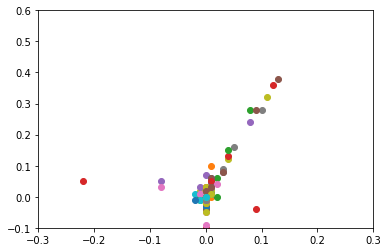

In [41]:
# plot each point using 2nd and 3rd eigen vector
def plot_by_eigenvectors(eig_vectors):
    plt.figure()
    for i, name in enumerate(my_graph.nodes()):
        v1 = eig_vectors[i, 3]
        v2 = eig_vectors[i, 2]
        # plt.annotate(name, xy=(v1, v2))
        plt.scatter(v1,v2)
        print(name, v1, v2)
    plt.xlim(-0.3,0.3)
    plt.ylim(-0.1,0.6)
    # plt.xlabel('second eigenvector value')
    # plt.ylabel('third eigenvector value')
    plt.show()
    
plot_by_eigenvectors(eig_vectors)

(array([  2.,   3., 444.,  62.,   6.,   6.,   0.,   1.,   4.,   2.]),
 array([-0.15 , -0.097, -0.044,  0.009,  0.062,  0.115,  0.168,  0.221,
         0.274,  0.327,  0.38 ]),
 <a list of 10 Patch objects>)

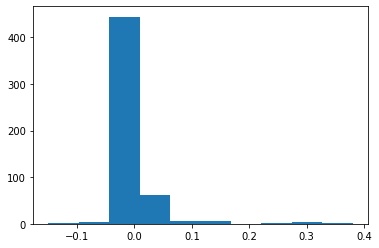

In [42]:
plt.hist(eig_vectors[:, 2])

### Partition by eigenvector

In [43]:
def partition_by_eigenvector(graph):
    """
    Using the get_second_eigenvector function above, partition the graph into
    two components using a splitting threshold of 0. That is, nodes
    whose corresponding value in the second eigenvector is >= 0 are in one cluster,
    and the rest are in the other cluster.
    Returns:
      A list of two networkx Graph objects, one per partition. 
      Sort these in ascending order of partition size.
    >>> graph = example_graph()
    >>> result = partition_by_eigenvector(graph)
    >>> sorted(result[0].nodes())
    ['A', 'B', 'C']
    >>> sorted(result[1].nodes())
    ['D', 'E', 'F', 'G']
    >>> round(norm_cut(result[0].nodes(), result[1].nodes(), graph),  2)
    0.42
    """
    ###TODO (4pt)
    second_eigenvector = -nx.fiedler_vector(graph)
    lst_positive = []
    lst_negative = []
    for i, v in enumerate(second_eigenvector):
      if v >= 0:
        lst_positive.append(list(graph.nodes())[i]) #lst_positive.append(sorted(list(graph.nodes()))[i])
      elif v < 0:
        lst_negative.append(list(graph.nodes())[i])
    sub_graph1 = graph.subgraph(lst_positive)
    sub_graph2 = graph.subgraph(lst_negative)
    return sorted([sub_graph1,sub_graph2], key=lambda x: x.size())  


In [44]:
def find_community(my_graph):
  graph_lst = []
  node_size_lst = []
  density_lst = []
  result = partition_by_eigenvector(my_graph)
  while len(sorted(result[1].nodes())) > 50:
    graph_lst.append(result)
    node_size_lst.append((len(sorted(result[0].nodes())),len(sorted(result[1].nodes()))))
    density_lst.append((nx.density(result[0]),nx.density(result[1])))
    result = partition_by_eigenvector(result[1])
  print(node_size_lst)
  print(density_lst)
  return graph_lst,node_size_lst,density_lst

In [45]:
graph_lst,node_size_lst,density_lst = find_community(my_graph)

[(50, 480), (48, 432), (34, 398), (19, 379), (61, 318), (38, 280), (43, 237), (17, 220), (28, 192), (29, 163), (20, 143), (11, 132), (21, 111), (36, 75)]
[(0.06693877551020408, 0.014196242171189978), (0.051418439716312055, 0.015306780097963393), (0.08377896613190731, 0.015227269850512006), (0.1111111111111111, 0.01574737194789965), (0.05136612021857923, 0.017479118306450013), (0.06827880512091039, 0.01876600102406554), (0.05758582502768549, 0.021240077236644495), (0.125, 0.02266500622665006), (0.07671957671957672, 0.026341623036649213), (0.08620689655172414, 0.03052336590168901), (0.12105263157894737, 0.03102531271545356), (0.21818181818181817, 0.03377284293314828), (0.10952380952380952, 0.03931203931203931), (0.07142857142857142, 0.0554954954954955)]


The smaller subgraph has larger density compared to the big graph.

In [46]:
node_size_lst = [(50, 480), (48, 432), (34, 398), (19, 379), (61, 318), (38, 280), (43, 237), (17, 220), (28, 192), (29, 163), (20, 143), (11, 132), (21, 111), (36, 75)]
density_lst = [(0.06693877551020408, 0.014196242171189978), (0.051418439716312055, 0.015306780097963393), (0.08377896613190731, 0.015227269850512006), (0.1111111111111111, 0.01574737194789965), (0.05136612021857923, 0.017479118306450013), (0.06827880512091039, 0.01876600102406554), (0.05758582502768549, 0.021240077236644495), (0.125, 0.02266500622665006), (0.07671957671957672, 0.026341623036649213), (0.08620689655172414, 0.03052336590168901), (0.12105263157894737, 0.03102531271545356), (0.21818181818181817, 0.03377284293314828), (0.10952380952380952, 0.03931203931203931), (0.07142857142857142, 0.0554954954954955)]

In [47]:
size_lst = []
for i,j in node_size_lst:
  size_lst.append(i)
size_lst.append(75)
sum(size_lst)/len(size_lst)

35.333333333333336

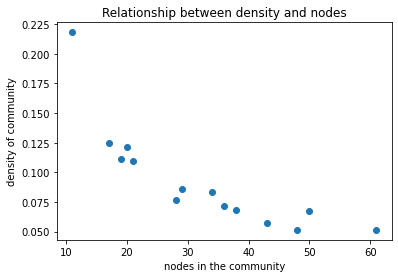

In [48]:
import matplotlib.pyplot as plt
import numpy as np
plt.plot([n for n,m in node_size_lst], [n for n,m in density_lst],'o')
plt.xlabel("nodes in the community")
plt.ylabel("density of community")
plt.title("Relationship between density and nodes")
plt.show()

In [49]:
from networkx.algorithms.assortativity import correlation

correlation, p_value = stats.pearsonr([n for n,m in node_size_lst] + [m for n,m in node_size_lst], [n for n,m in density_lst] + [m for n,m in density_lst])
correlation
correlation, p_value = stats.pearsonr([n for n,m in node_size_lst], [n for n,m in density_lst])
correlation

-0.8206470748283107

The density of the graph and the number of nodes within the graph have negative correlation.

In [50]:
graph_lst[0][0].nodes()

NodeView(('Kazzazashinobi', 'Op-Toe-Mus-Rim-Dong', 'paintcan76', 'marty_byrd_', 'CakeDayyyylmao', 'stuDEADnt', 'Standard_Procedure_', 'ciarranm', 'Redclicker', 'AlarmingStorm32', 'SilentDis', 'minimac19', 'MsSuccubus', 'fox1acorn', 'm4RLA5INGER', 'Vivek_Gooner', 'Excuse_my_GRAMMER', 'mapo69', 'dharlow', 'OnyxiasLair', 'arpretty', 'Foreveryoung0114', 'jicaray', '777cap', 'Kalculator', 'Western-Ad8280', 'PVB_gal', 'duke9350', 'pepling1000', 'xb4r7x', 'PLDeans', 'reallyseska', 'kimchiconnoisseur', 'Commercial_Garlic_69', 'remotejobtipsdotcom', 'ginger_rabies', 'thats_hella_cool', 'Keiss_Myass', 'ellevera', 'Impressive_Degree_37', 'jbpark9687', 'griff_girl', 'So_Much_Cauliflower', 'Hatesville', 'searchhard_', 'mr_green1216', 'joebrown75', 'Miscblogger92', 'himynameis_mel', 'organizeeverything'))

In [51]:
nx.density(graph_lst[11][0])

0.21818181818181817

In [52]:
graph_lst[11][0].nodes()

NodeView(('Acceptable-Put4588', 'hauntedhalloween_96', 'ems2525', 'generatorland', 'fartliberator', 'beereng', 'daxsm', 'VoicePing', 'Val_Ribon', 'AggressivePlum7094', 'babymoominnn'))

In [53]:
random_nodes_lst = [random.sample(list(graph_lst[i][0].nodes()),2) for i in range(14)]
random_nodes = []
for i in random_nodes_lst:
  for j in i:
    random_nodes.append(j)
random_nodes.extend(random.sample(list(graph_lst[13][1].nodes()),2))

In [54]:
len(random_nodes)

30

In [55]:
random_nodes

['m4RLA5INGER',
 'Kazzazashinobi',
 'the70sman',
 'marcal213',
 'Penguin-Pete',
 'ChrisPlansIt',
 '0nesanctum',
 'HIGHrolling98',
 'Cold-Tomorrow-3148',
 'Potential_Working_64',
 'Kesa_Gatame',
 'qbit1010',
 'dustyalmond',
 'MereGoHawks',
 'EnterTheN1nja',
 'Hooker_in_paradise',
 'ArinaWolf',
 'Kahlua14',
 'tooturntupp',
 'amknight127',
 'duganaok',
 'anacid99',
 'babymoominnn',
 'Val_Ribon',
 'jennal93',
 'maryg95030',
 'alex35351',
 'Minute_Material_3646',
 'big_lemon_jerky',
 'ProfLeprechaun']

### Plot direct network

In [56]:
all_direct_graph = []

for g in graph_lst:
  new_graph1 = nx.DiGraph()
  for k,v in dic_all.items():
    if v['post author'] in g[0].nodes():
      for c_author in set(v['comments author']):
        if c_author in g[0].nodes() and c_author != v['post author']:
          new_graph1.add_edge(c_author,v['post author'])
  all_direct_graph.append(new_graph1)
# nx.draw(my_graph, with_labels=True)

In [57]:
len(graph_lst[0][0].nodes())

50

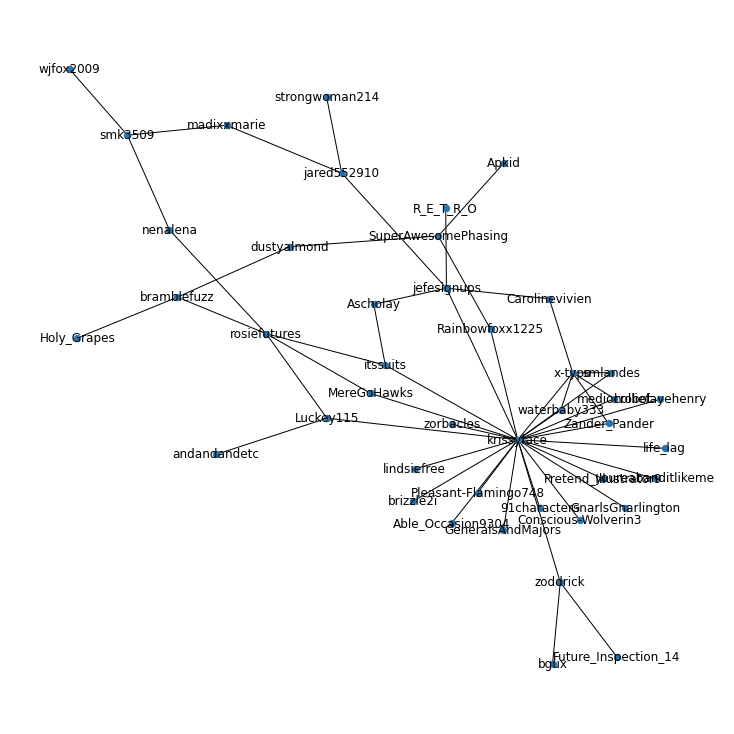

In [58]:
plt.figure(figsize=(10,10)) 
nx.draw(graph_lst[6][0], with_labels=True,node_size=40)
plt.show()

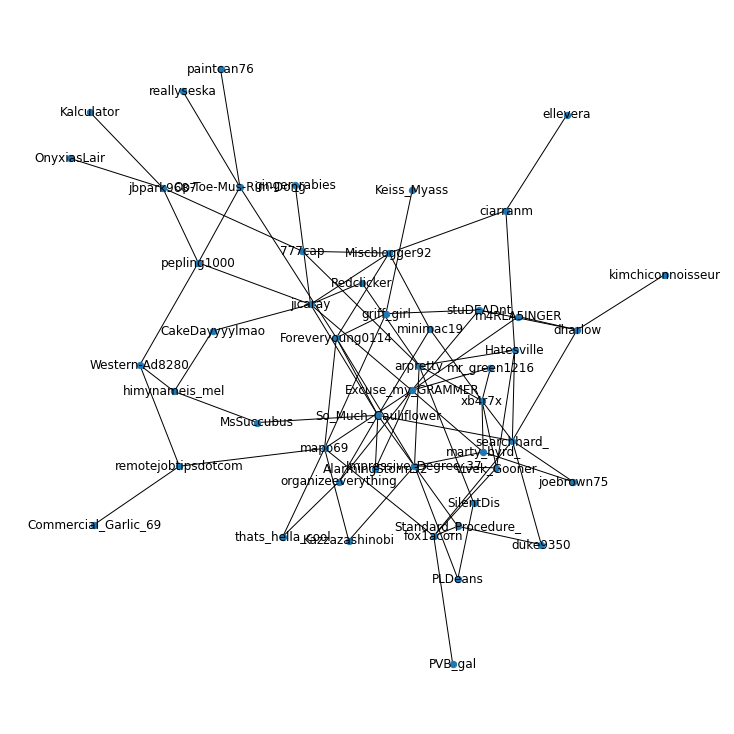

In [59]:
plt.figure(figsize=(10,10)) 
nx.draw(graph_lst[0][0], with_labels=True,node_size=40)
plt.show()

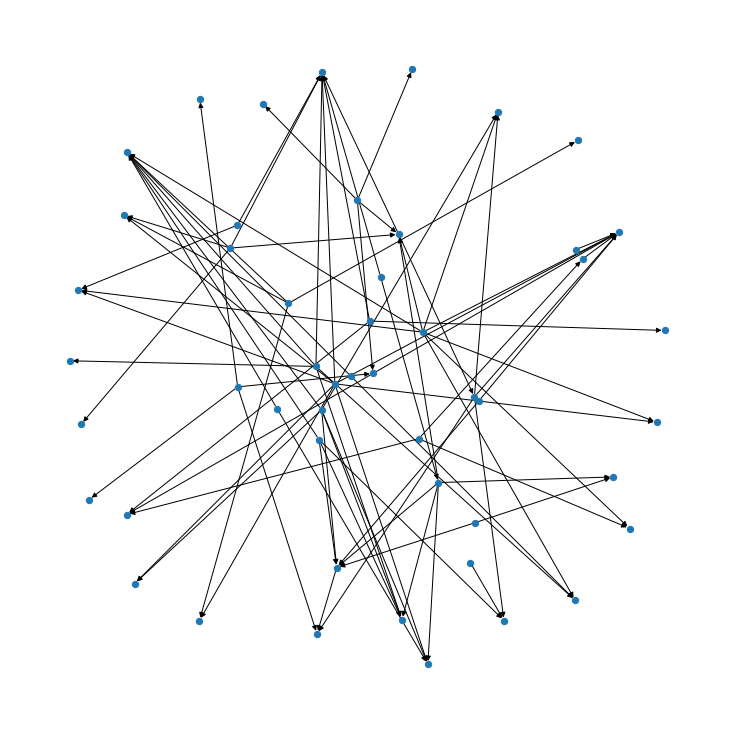

In [60]:
# NO.0
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[0], with_labels=False,node_size=40)
plt.show()

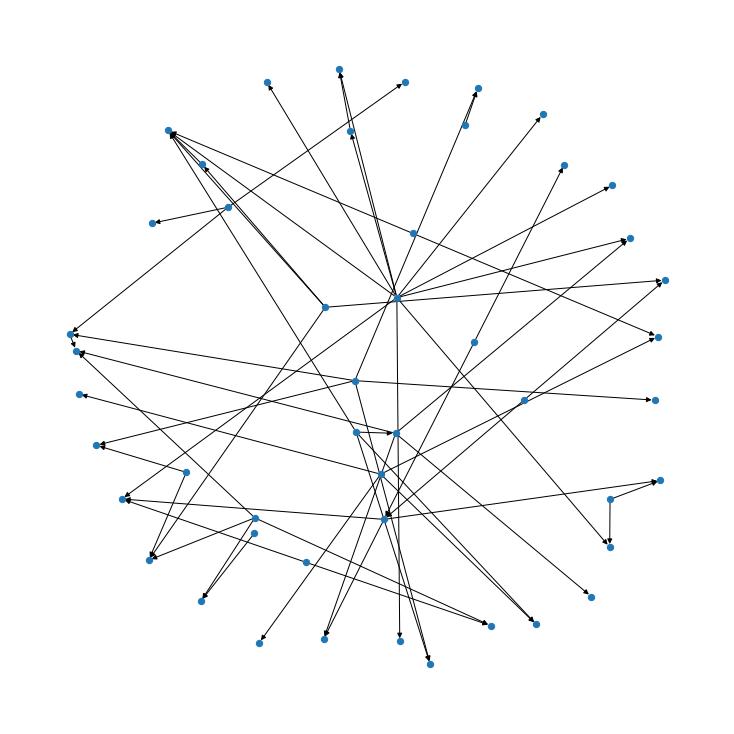

In [61]:
# NO.1
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[1], with_labels=False,node_size=40)
plt.show()

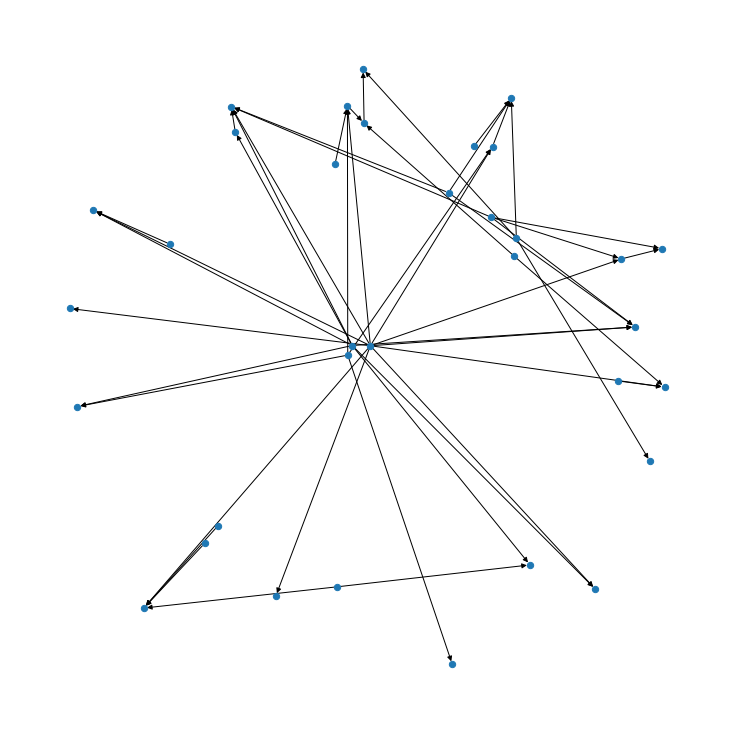

In [62]:
# NO.2
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[2], with_labels=False,node_size=40)
plt.show()

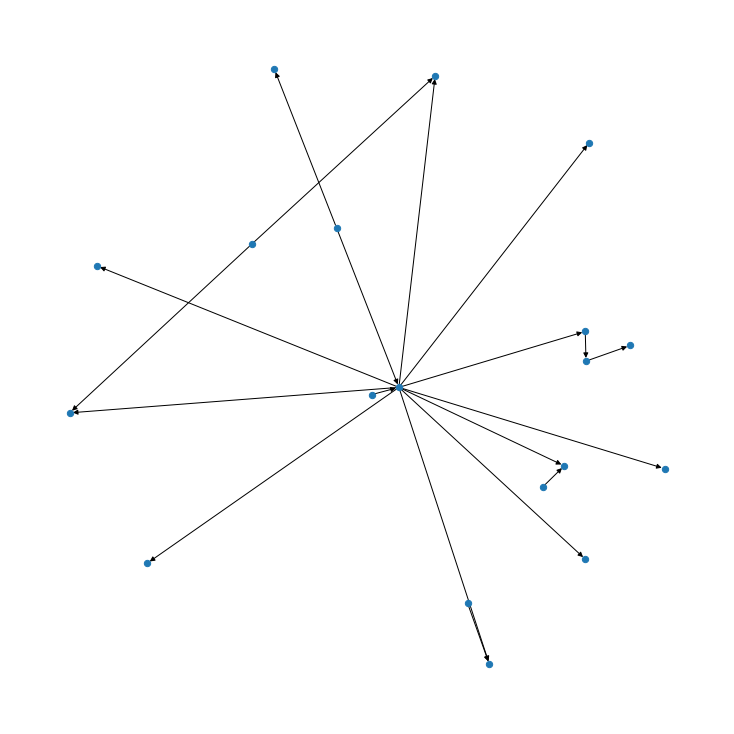

In [63]:
# NO.3
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[3], with_labels=False,node_size=40)
plt.show()

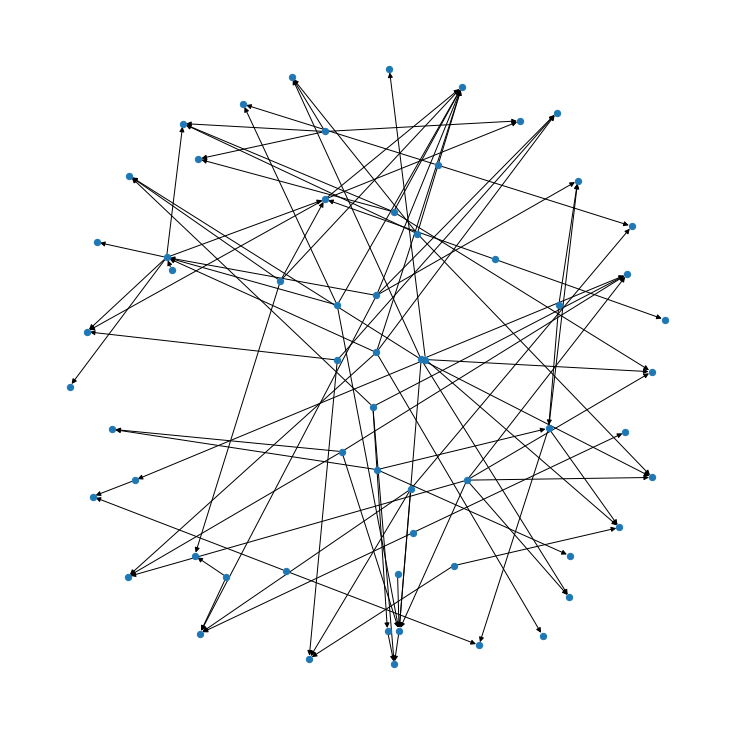

In [64]:
# NO.4
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[4], with_labels=False,node_size=40)
plt.show()

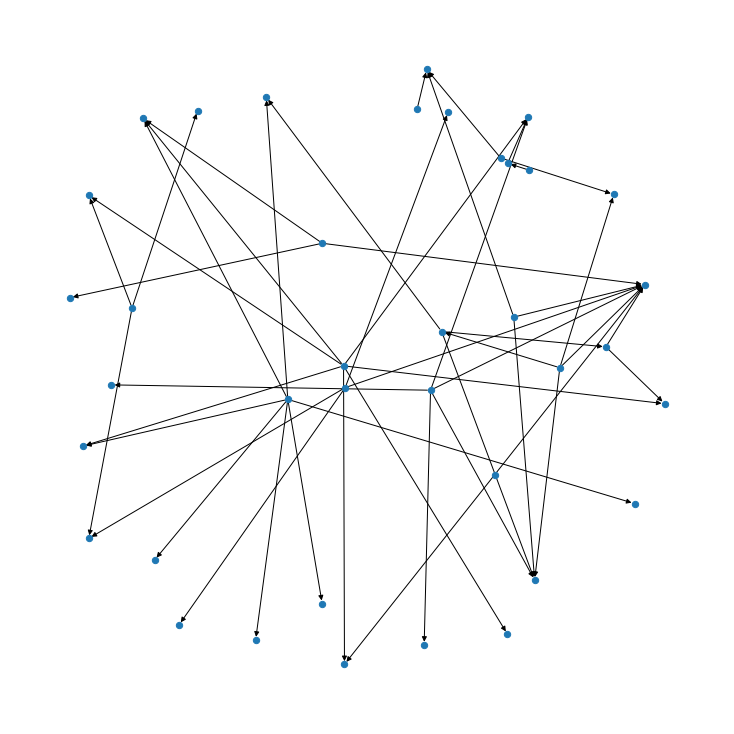

In [65]:
# NO.5
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[5], with_labels=False,node_size=40)
plt.show()

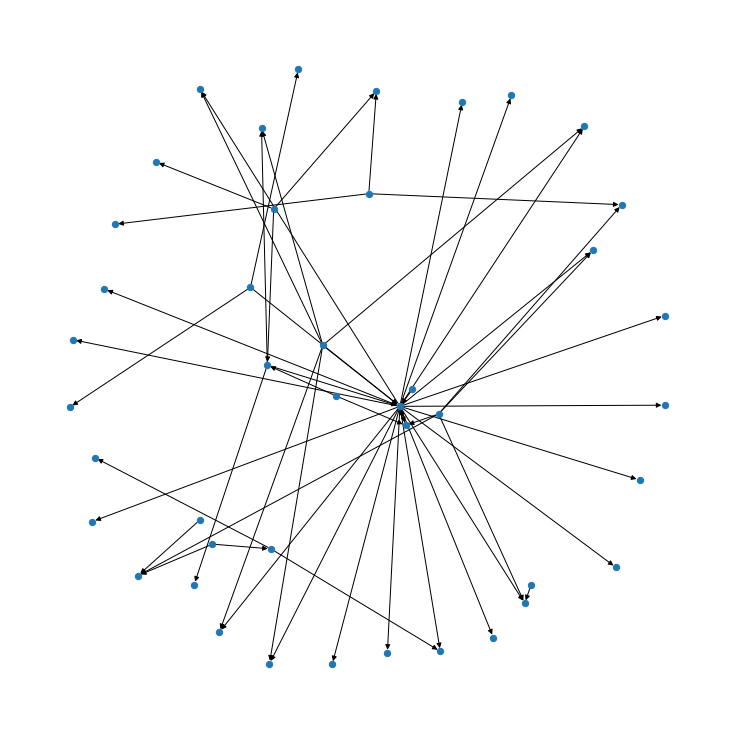

In [66]:
# NO.6
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[6], with_labels=False,node_size=40)
plt.show()

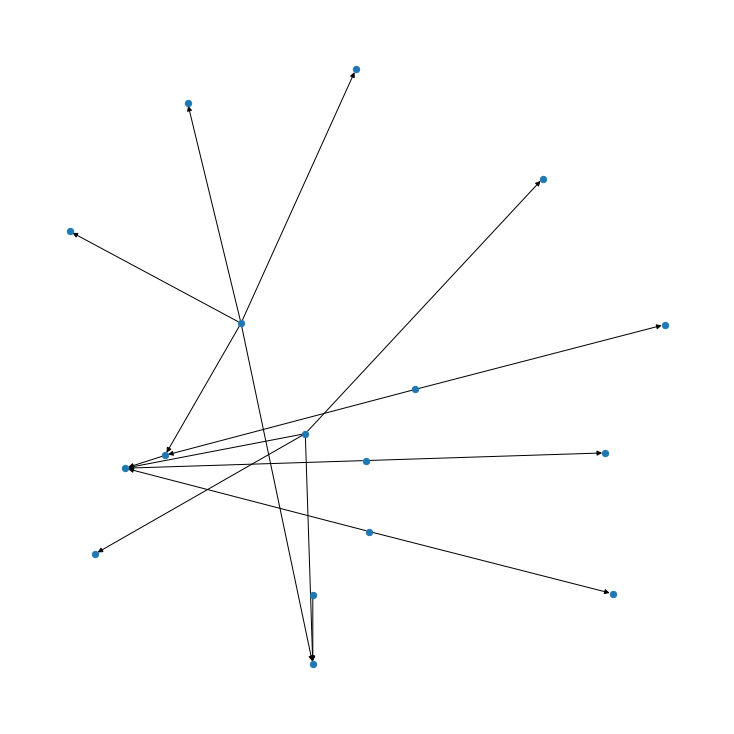

In [67]:
# NO.7
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[7], with_labels=False,node_size=40)
plt.show()

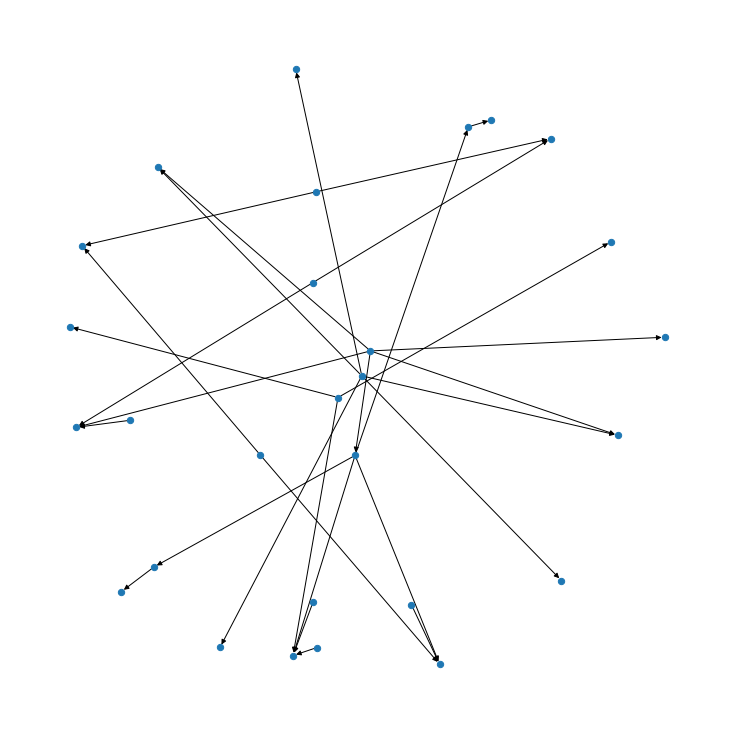

In [68]:
# NO.8
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[8], with_labels=False,node_size=40)
plt.show()

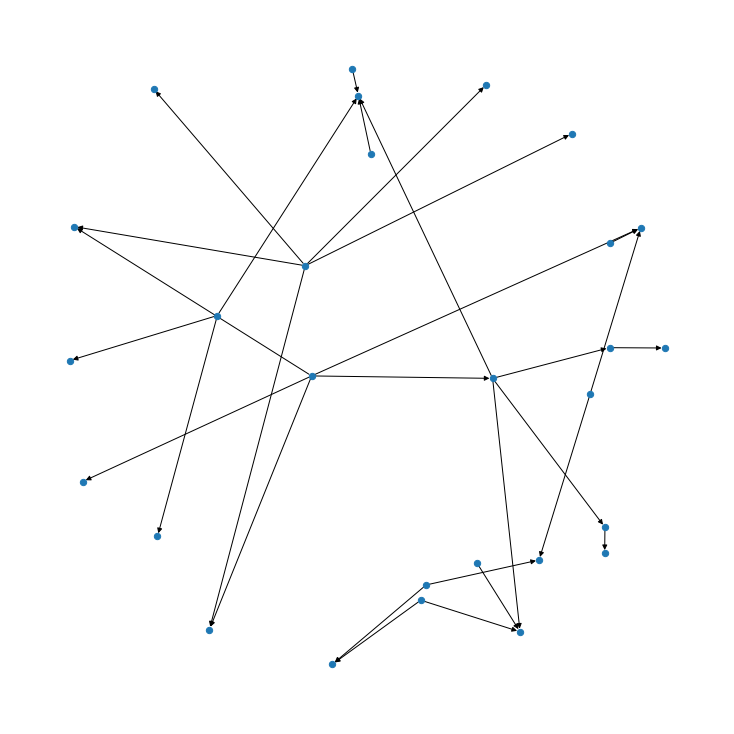

In [69]:
# NO.8
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[8], with_labels=False,node_size=40)
plt.show()

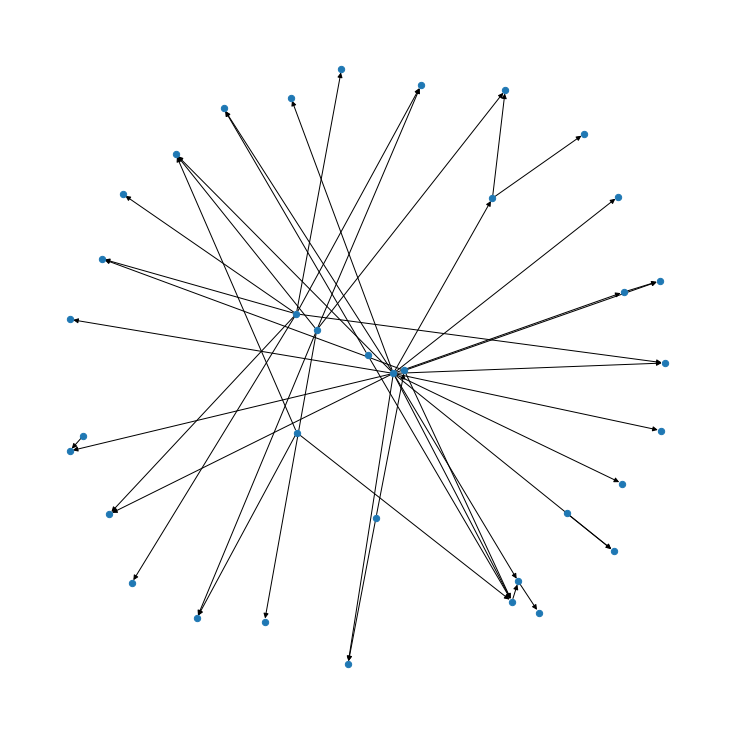

In [70]:
# NO.13
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[13], with_labels=False,node_size=40)
plt.show()

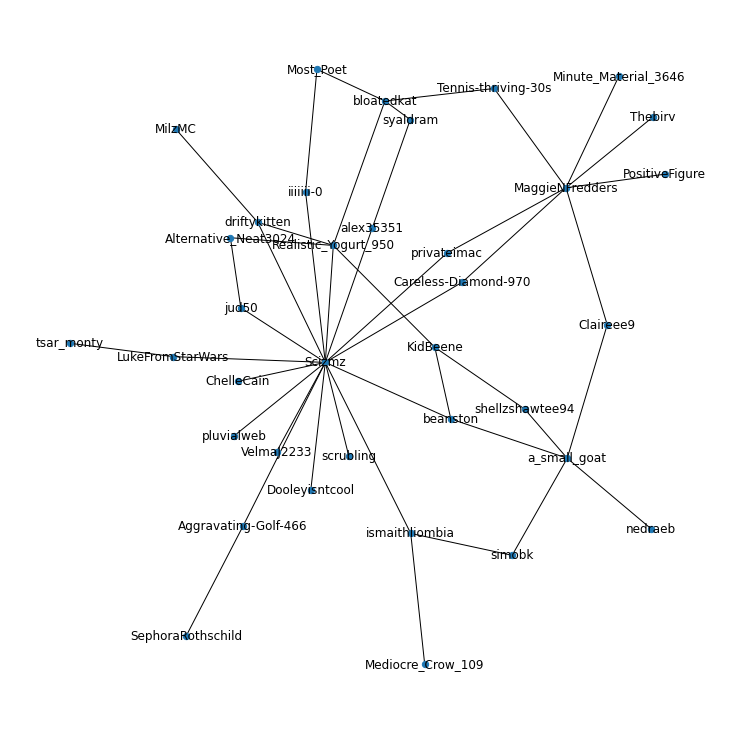

In [71]:
plt.figure(figsize=(10,10)) 
nx.draw(graph_lst[13][0], with_labels=True,node_size=40)
plt.show()

In [72]:
# for one graph
# new_graph1 = nx.DiGraph()
# for k,v in dic_all.items():
#   if v['post author'] in graph_lst[13][1].nodes():
#     for c_author in set(v['comments author']):
#       if c_author in graph_lst[13][1].nodes() and c_author != v['post author']:
#         new_graph1.add_edge(c_author,v['post author'])

### Correlation between the posts of sub-community

In [73]:
# sub-graph
author_sentences = {}
for k, v in wfh_comments.items():
  if v['author'] in all_direct_graph[13].nodes(): #graph_lst[6][0].nodes() #random_nodes
    if v['author'] not in author_sentences.keys():
      author_sentences[v['author']] = v['comments']
    else:
      author_sentences[v['author']] += ' '
      author_sentences[v['author']] += v['comments']

for k, v in wfh_posts.items():
  if v['author'] in all_direct_graph[13].nodes(): #graph_lst[6][0].nodes()
    if v['author'] not in author_sentences.keys():
      author_sentences[v['author']] = v['text']
    else:
      author_sentences[v['author']] += ' '
      author_sentences[v['author']] += v['text']


In [74]:
# random graph
author_sentences = {}
for k, v in wfh_comments.items():
  if v['author'] in random_nodes: #graph_lst[6][0].nodes() #random_nodes
    if v['author'] not in author_sentences.keys():
      author_sentences[v['author']] = v['comments']
    else:
      author_sentences[v['author']] += ' '
      author_sentences[v['author']] += v['comments']

for k, v in wfh_posts.items():
  if v['author'] in random_nodes: #graph_lst[6][0].nodes()
    if v['author'] not in author_sentences.keys():
      author_sentences[v['author']] = v['text']
    else:
      author_sentences[v['author']] += ' '
      author_sentences[v['author']] += v['text']


In [75]:
author_sentences

{'0nesanctum': "Should I get slippers or out door shoes when working from home? Ever since I started working from home about a year ago I started burning through slippers. The last pair I bought was Sorel. \n\nI have wood floors so without slippers my feet tend to get cold and sore throughout the day. I don't want to buy new slippers 1-3 times every year so I was thinking maybe I should just buy an outdoor pair of shoes and throw in some insoles. \n\nWhat are peoples thoughts on this? Anyone do this or are there some better slippers that don't melt away?",
 'ArinaWolf': "Yep, exactly lol. Also I had THE shittiest jobs before this one. While I get the frustration of some people about it, I've had a job I hated so much I seriously considered ending it all because I saw no reason to live like that so yeah, sorry I don't wanna just waste time looking at a screen when there's nothing to be done. I just want to improve some other skills in the meantime and I'm still right besides my laptop. 

In [76]:
all_direct_graph[13].edges('Scizmz')

OutEdgeDataView([('Scizmz', 'jud50'), ('Scizmz', 'pluvialweb'), ('Scizmz', 'privateimac'), ('Scizmz', 'Dooleyisntcool'), ('Scizmz', 'Realistic_Yogurt_950'), ('Scizmz', 'driftykitten'), ('Scizmz', 'beanston'), ('Scizmz', 'scrubling'), ('Scizmz', 'Careless-Diamond-970'), ('Scizmz', 'LukeFromStarWars'), ('Scizmz', 'Aggravating-Golf-466'), ('Scizmz', 'alex35351'), ('Scizmz', 'ChelleCain'), ('Scizmz', 'iiiiiii-0'), ('Scizmz', 'ismaithliombia'), ('Scizmz', 'VelmaJ2233')])

In [77]:
import gensim
import pandas
import sklearn
from gensim.models import Word2Vec

In [78]:
model_address = "/content/drive/MyDrive/GoogleNews-vectors-negative300.bin" 

In [79]:
google_w2v_model = gensim.models.KeyedVectors.load_word2vec_format(model_address, binary=True)

In [80]:
from numpy.ma.extras import average
# sentence = 'what are you doing'.split()
# sentence

average_embedding = {}
for k, v in author_sentences.items():
  average_word = []
  for word in v.split():
    try:
      average_word.append(google_w2v_model[word])
    except KeyError:
      pass
  average_embedding[k] = list(np.array(average_word).mean(axis=0))

In [81]:
dataframe = pd.DataFrame(average_embedding, columns=average_embedding.keys())
# form correlation matrix
matrix = dataframe.corr()

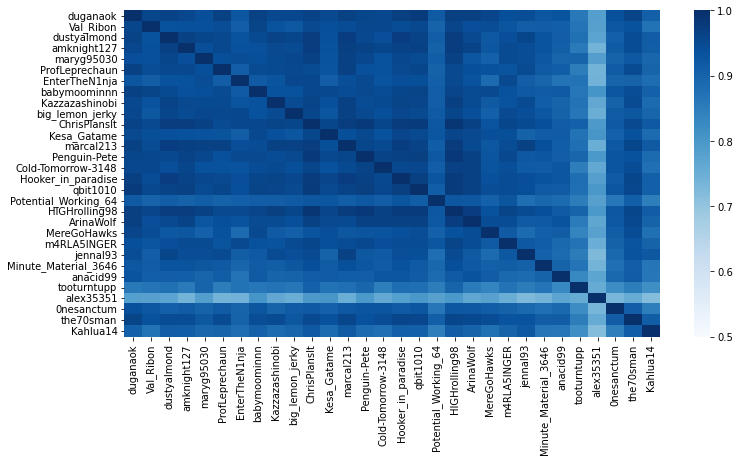

In [82]:
# random nodes
plt.figure(figsize=(12, 6))
sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');


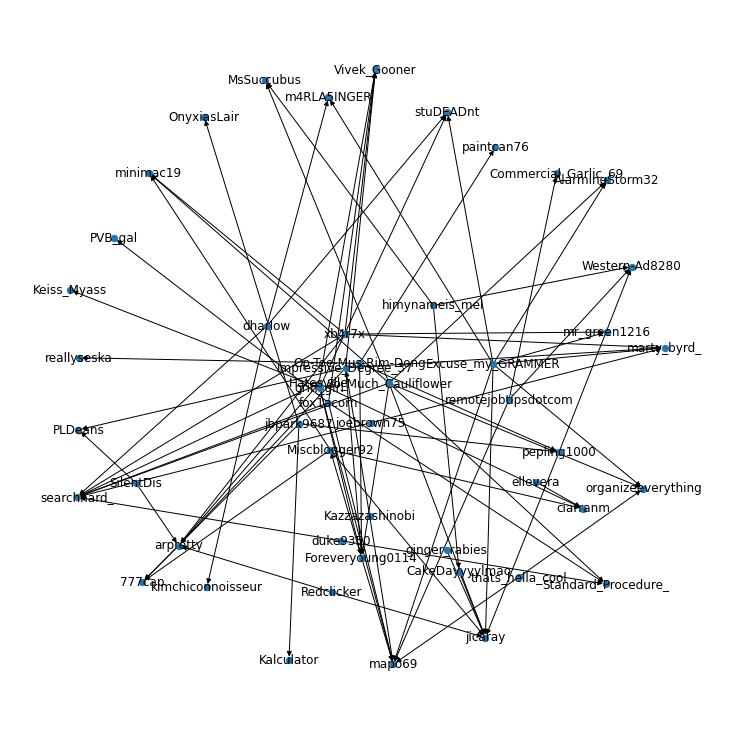

In [83]:
# NO.0
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[0], with_labels=True,node_size=40)
plt.show()

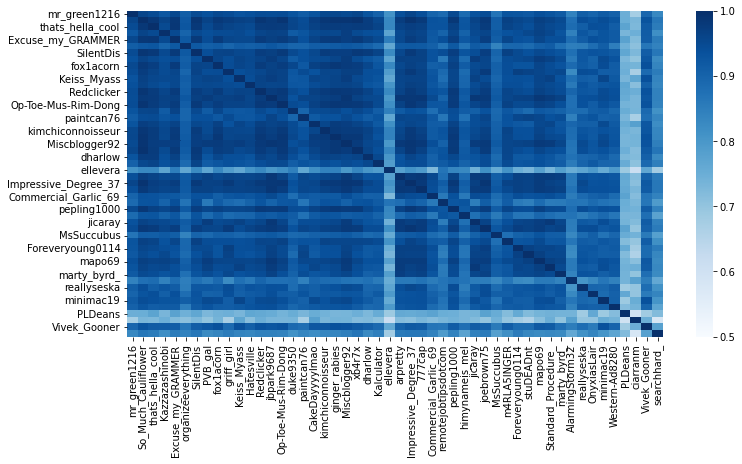

In [ ]:
# NO.0
plt.figure(figsize=(12, 6))
sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');


In [84]:
print(node_size_lst[0][0],density_lst[0][0])

50 0.06693877551020408


- To get the results for each correlation matrix of sub-graph, you should change the `author sentence` dictionary by putting into different graph's nodes. 

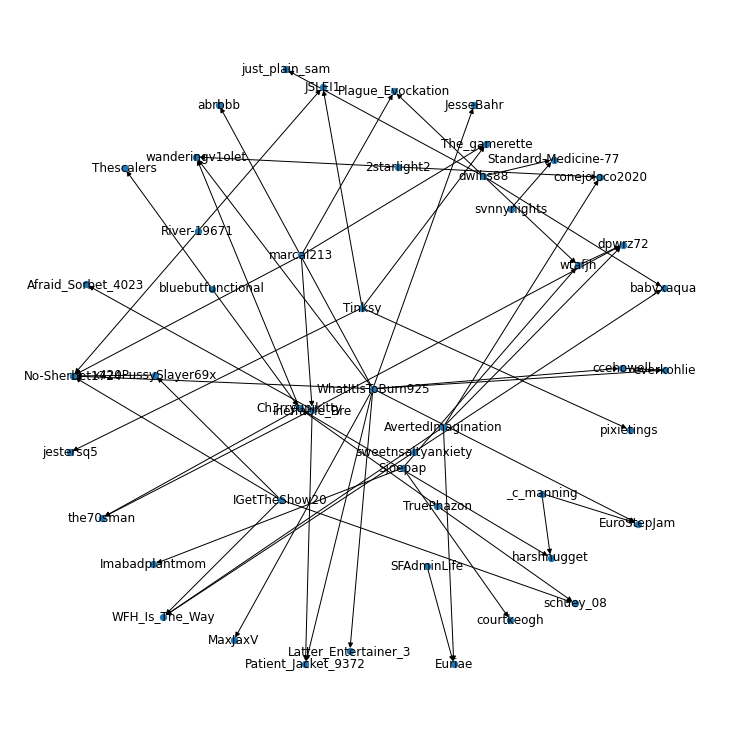

In [ ]:
# NO.1
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[1], with_labels=True,node_size=40)
plt.show()

48 0.051418439716312055


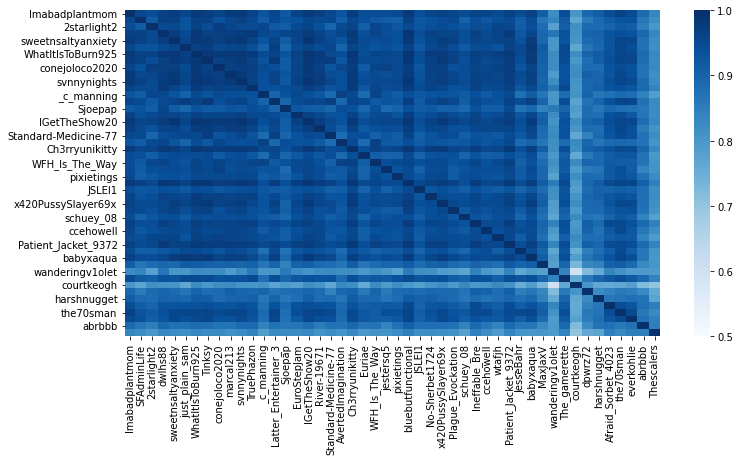

In [ ]:
# # NO.1
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[1][0],density_lst[1][0])

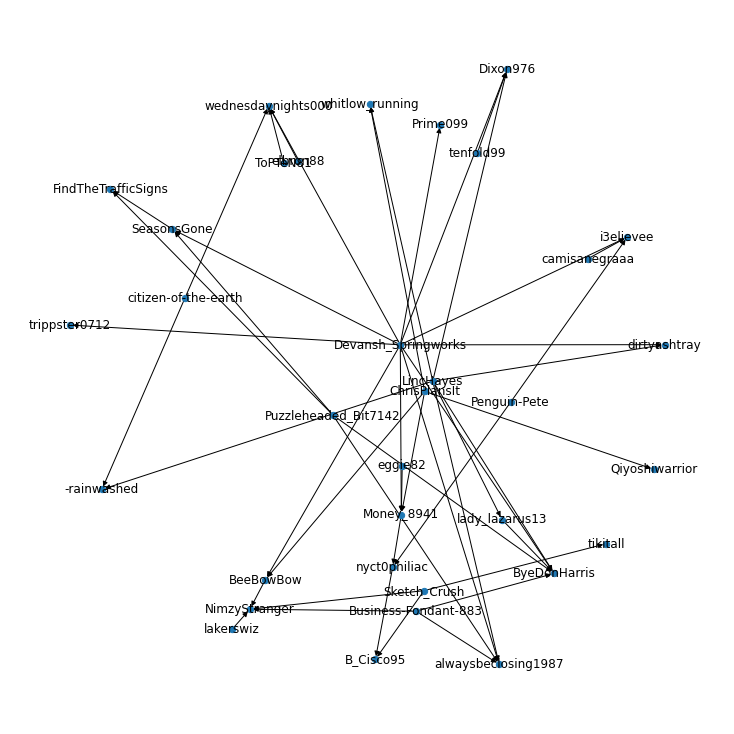

In [ ]:
# NO.2
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[2], with_labels=True,node_size=40)
plt.show()

34 0.08377896613190731


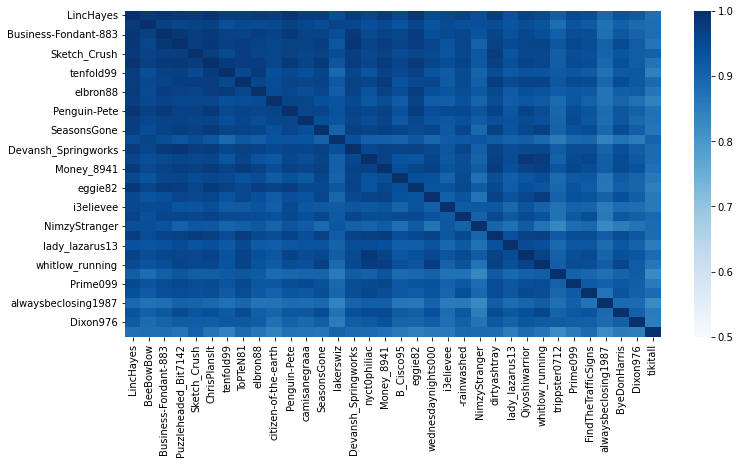

In [ ]:
# # NO.2
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[2][0],density_lst[2][0])

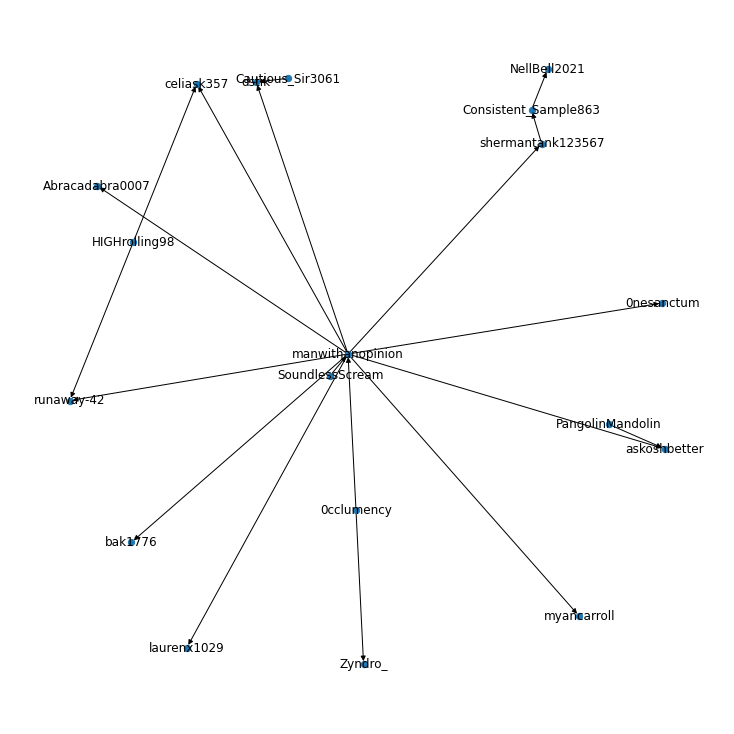

In [ ]:
# NO.3
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[3], with_labels=True,node_size=40)
plt.show()

19 0.1111111111111111


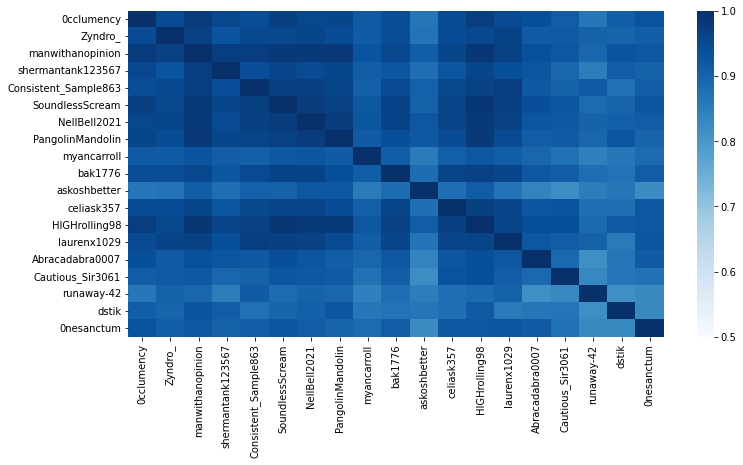

In [ ]:
# # NO.3
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[3][0],density_lst[3][0])

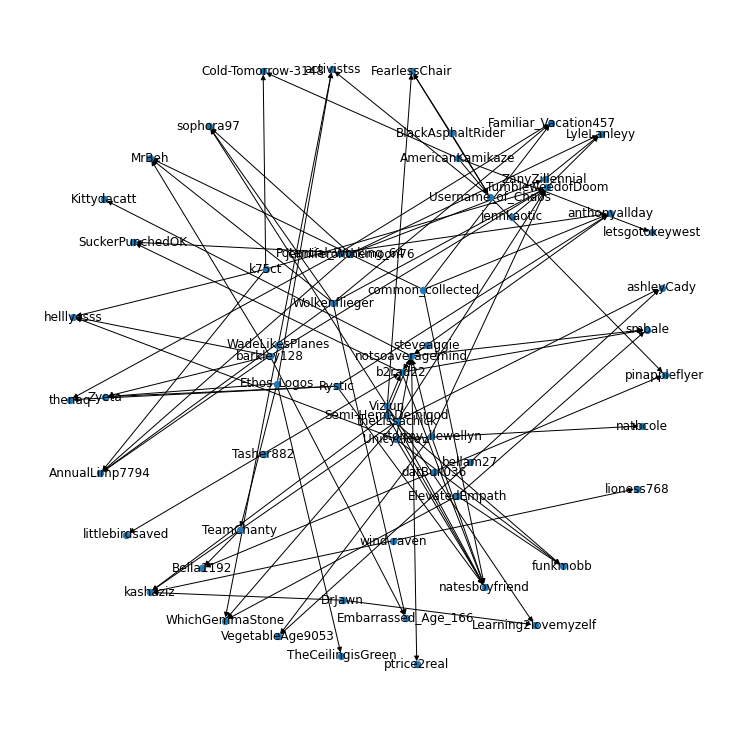

In [85]:
# NO.4
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[4], with_labels=True,node_size=40)
plt.show()

61 0.05136612021857923


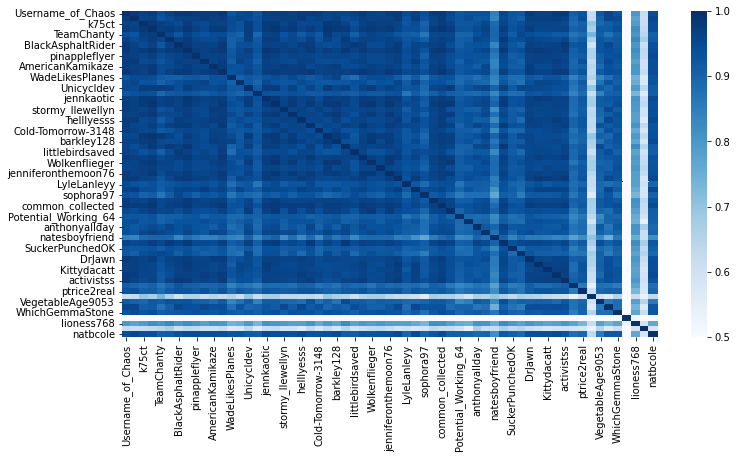

In [ ]:
# # NO.4
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[4][0],density_lst[4][0])

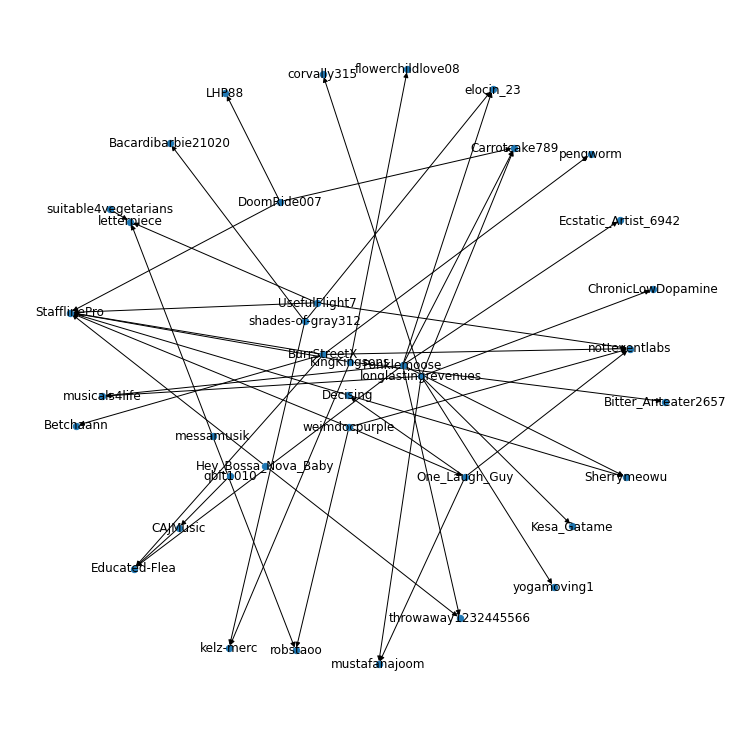

In [ ]:
# NO.5
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[5], with_labels=True,node_size=40)
plt.show()

38 0.06827880512091039


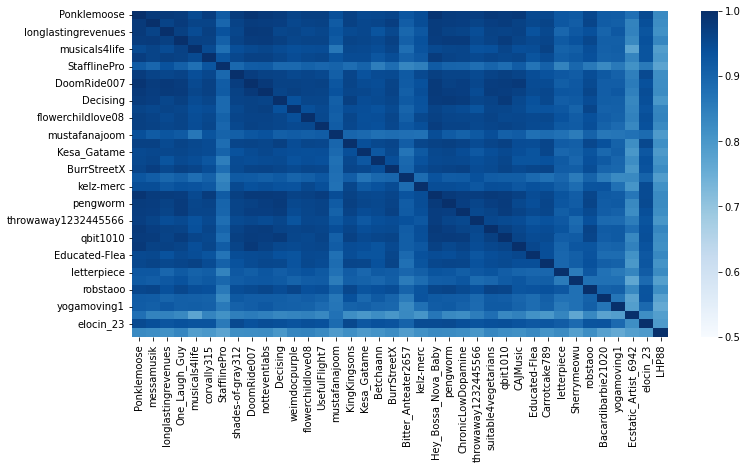

In [ ]:
# # NO.5
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[5][0],density_lst[5][0])

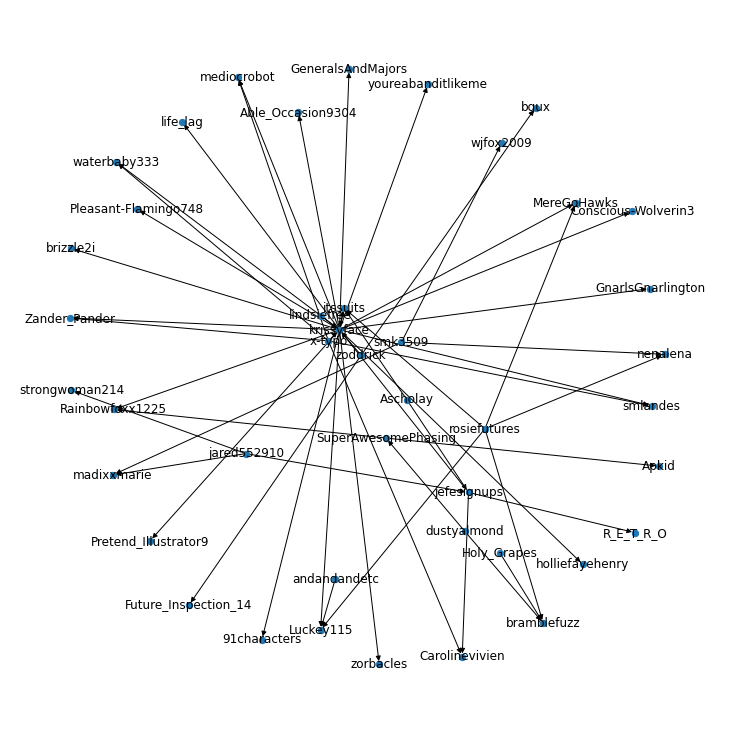

In [ ]:
# NO.6
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[6], with_labels=True,node_size=40)
plt.show()

43 0.05758582502768549


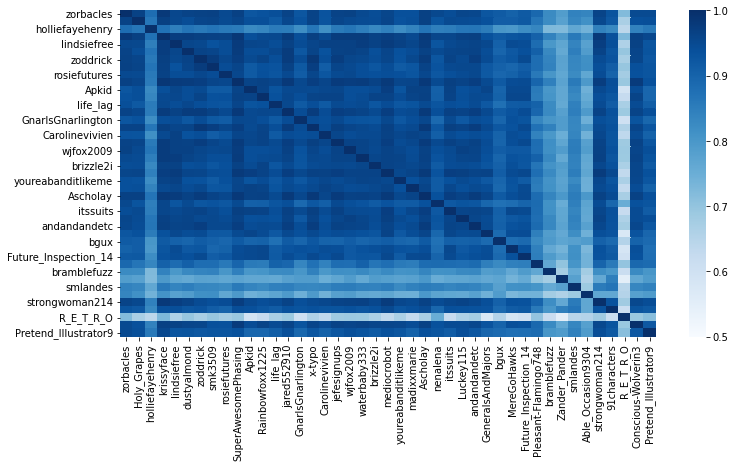

In [ ]:
# # NO.6
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[6][0],density_lst[6][0])

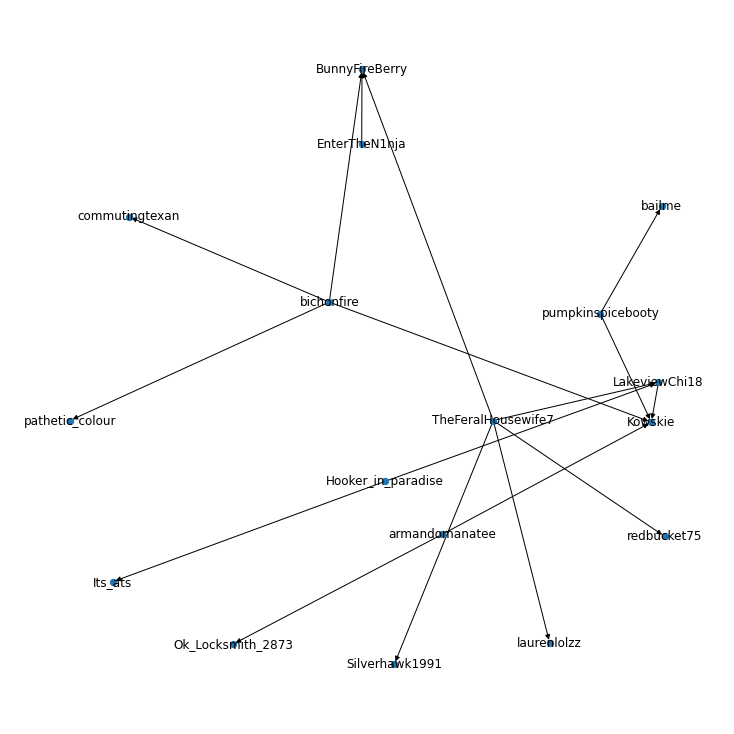

In [ ]:
# NO.7
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[7], with_labels=True,node_size=40)
plt.show()

17 0.125


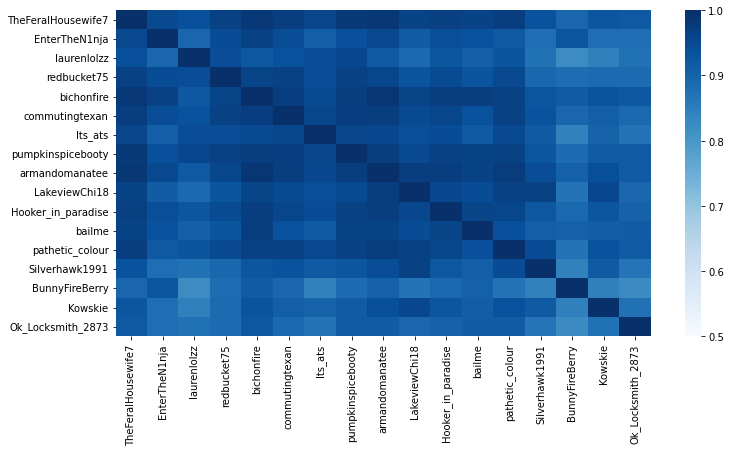

In [ ]:
# # NO.7
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[7][0],density_lst[7][0])

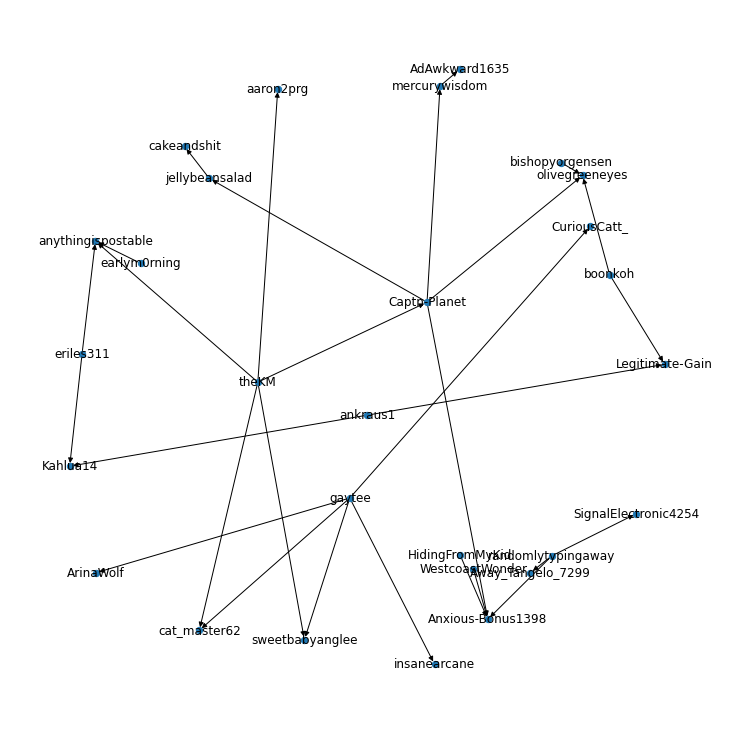

In [ ]:
# NO.8
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[8], with_labels=True,node_size=40)
plt.show()

28 0.07671957671957672


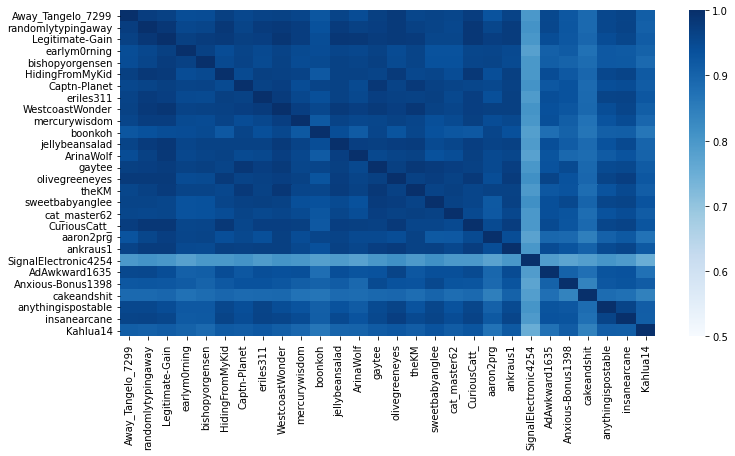

In [ ]:
# # NO.8
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[8][0],density_lst[8][0])

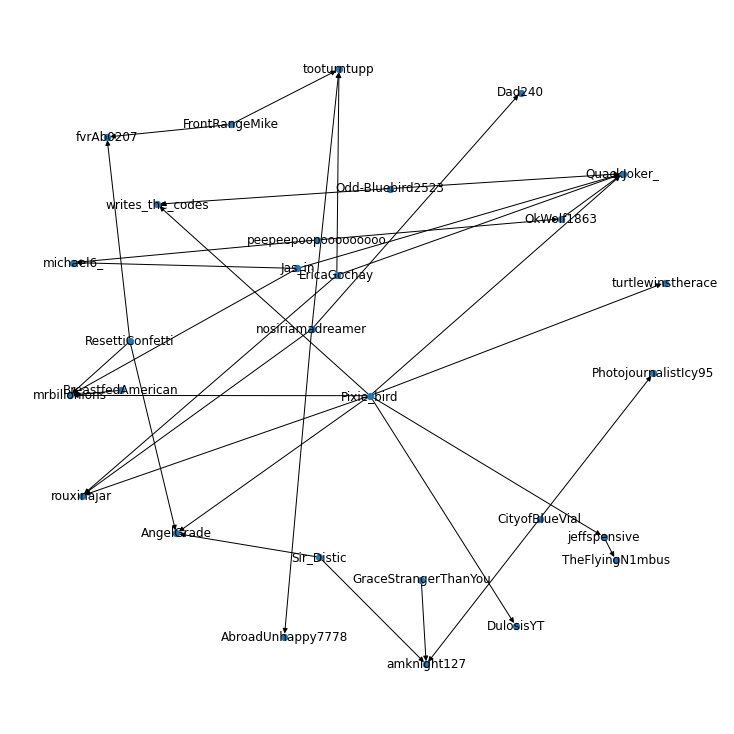

In [ ]:
# NO.9
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[9], with_labels=True,node_size=40)
plt.show()

29 0.08620689655172414


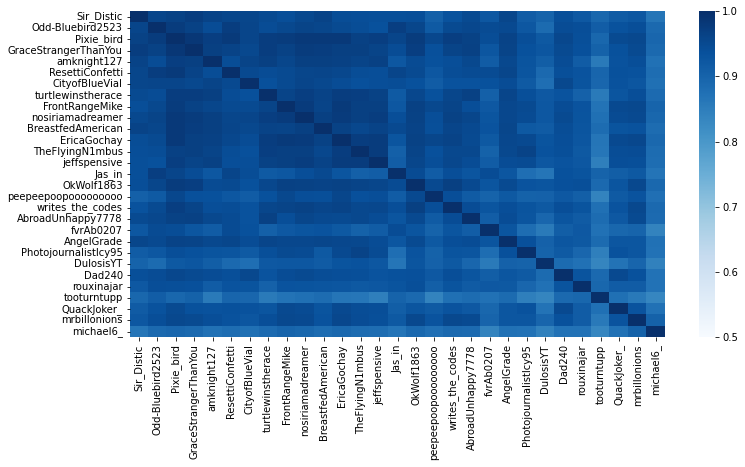

In [ ]:
# # NO.9
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[9][0],density_lst[9][0])

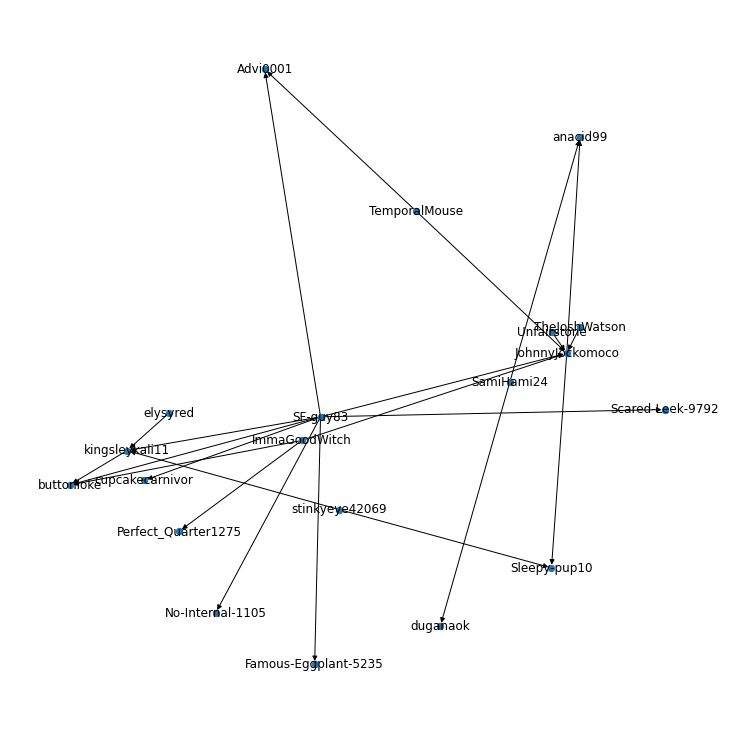

In [ ]:
# NO.10
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[10], with_labels=True,node_size=40)
plt.show()

20 0.12105263157894737


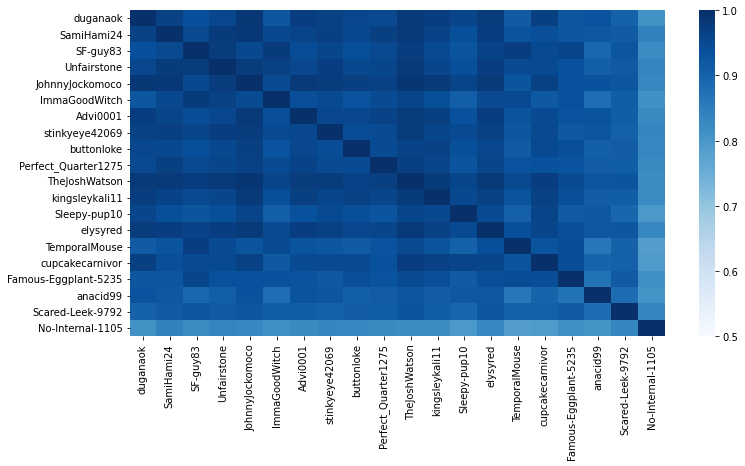

In [ ]:
# # NO.10
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[10][0],density_lst[10][0])

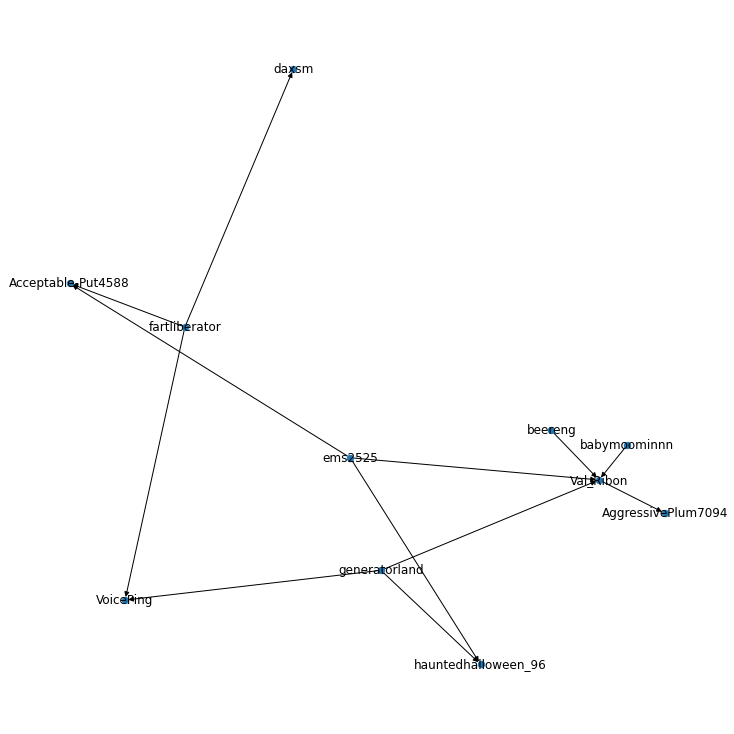

In [ ]:
# NO.11
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[11], with_labels=True,node_size=40)
plt.show()

11 0.21818181818181817


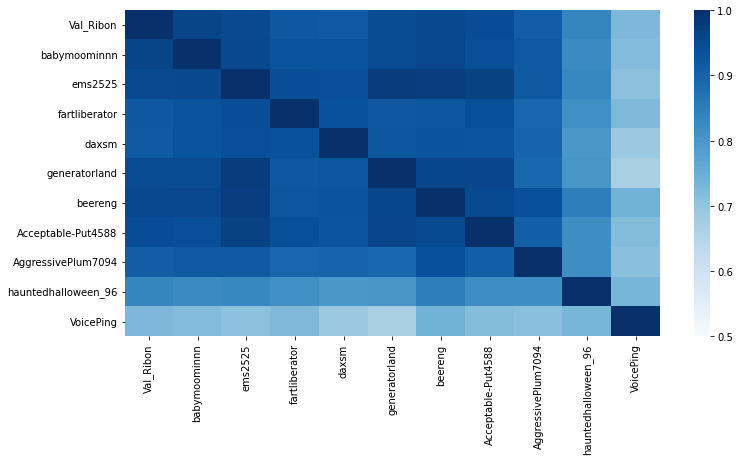

In [ ]:
# # NO.11
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[11][0],density_lst[11][0])

21 0.10952380952380952


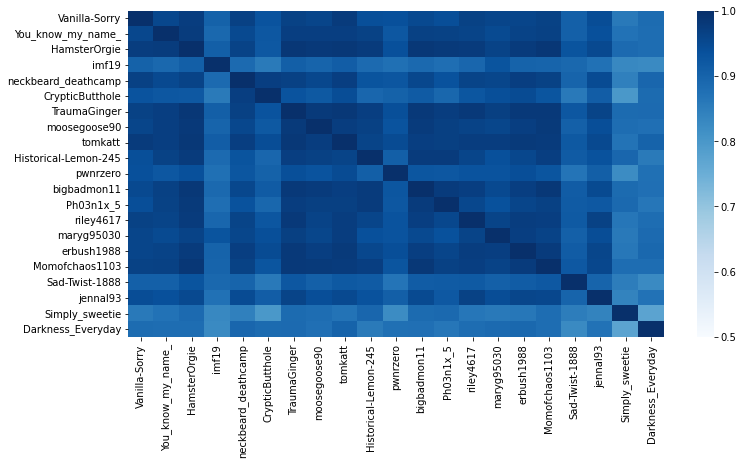

In [ ]:
# # NO.12
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[12][0],density_lst[12][0])

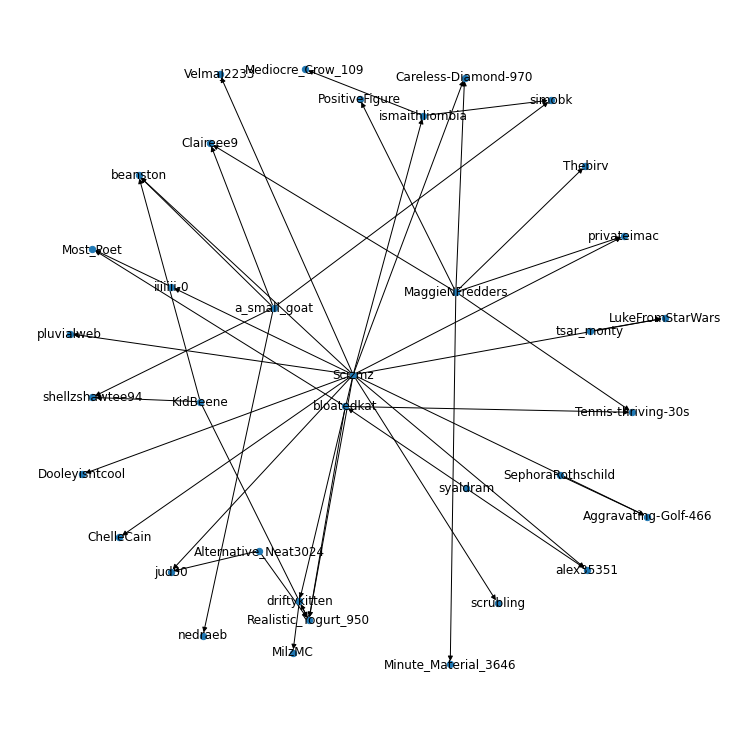

In [ ]:
# NO.13
plt.figure(figsize=(10,10)) 
nx.draw(all_direct_graph[13], with_labels=True,node_size=40)
plt.show()

36 0.07142857142857142


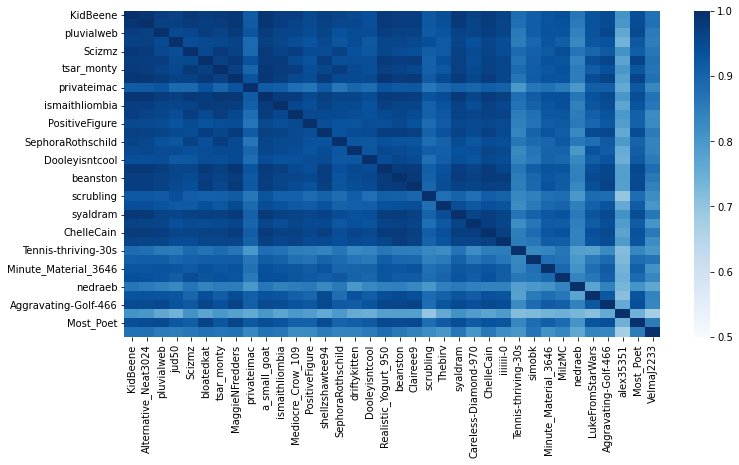

In [ ]:
# # NO.13
# plt.figure(figsize=(12, 6))
# sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');
# print(node_size_lst[13][0],density_lst[13][0])

In [86]:
dataframe

,duganaok,Val_Ribon,dustyalmond,amknight127,maryg95030,ProfLeprechaun,EnterTheN1nja,babymoominnn,Kazzazashinobi,big_lemon_jerky,...,MereGoHawks,m4RLA5INGER,jennal93,Minute_Material_3646,anacid99,tooturntupp,alex35351,0nesanctum,the70sman,Kahlua14
0,0.027270,0.038318,0.039856,0.048725,0.012578,0.028300,0.040163,0.013398,0.016583,0.015684,...,0.048714,0.019874,0.024463,0.031947,0.038158,0.084938,0.088209,0.030082,0.044277,0.023700
1,0.019634,0.041218,0.010482,0.015773,0.028099,0.020902,0.004616,0.022038,0.008663,0.013503,...,0.015856,-0.001576,0.034831,0.006487,0.026710,-0.004931,0.051663,0.016561,0.022273,0.033756
2,0.032316,0.025744,0.023251,0.032217,0.019423,0.025078,0.031261,0.036108,0.014330,0.017670,...,0.023567,0.041068,0.029180,-0.004433,0.013383,0.044971,-0.019287,0.024545,0.044298,0.064039
3,0.112098,0.112894,0.094881,0.086026,0.101631,0.096242,0.103927,0.085571,0.099967,0.106251,...,0.115423,0.103675,0.098383,0.112242,0.116428,0.139935,0.180339,0.127916,0.106596,0.072777
4,-0.043193,-0.037986,-0.046169,-0.057940,-0.063937,-0.029400,-0.069600,-0.056932,-0.046651,-0.059010,...,-0.036689,-0.057383,-0.042484,-0.048756,-0.049066,-0.070380,-0.098775,-0.035474,-0.038330,-0.079196
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,-0.021189,-0.027486,0.000074,-0.011989,-0.010804,-0.008321,-0.016615,-0.017187,-0.016260,-0.019963,...,-0.035396,-0.026328,-0.007452,-0.026477,-0.034905,0.045139,-0.020623,-0.024719,0.000297,0.006779
296,0.004203,0.021266,0.026090,0.033500,0.001020,0.007671,-0.000248,0.001661,0.039964,0.002423,...,0.023878,-0.007754,0.009944,0.053887,0.003458,0.020424,-0.020176,0.025085,0.027586,-0.005680
297,-0.021802,-0.012984,-0.030921,-0.042799,-0.030991,-0.014979,-0.051760,-0.040286,-0.029736,-0.027147,...,-0.017512,-0.039734,-0.021361,-0.038293,0.003061,-0.050346,-0.010484,-0.013356,-0.033901,-0.037401
298,0.039077,0.038186,0.032542,0.019956,0.040955,0.023500,0.008340,0.045357,0.023097,0.015151,...,0.058639,0.030560,0.032332,0.015799,0.022878,0.007263,0.013713,0.065844,0.017837,0.033912


In [87]:
dataframe.corr()

,duganaok,Val_Ribon,dustyalmond,amknight127,maryg95030,ProfLeprechaun,EnterTheN1nja,babymoominnn,Kazzazashinobi,big_lemon_jerky,...,MereGoHawks,m4RLA5INGER,jennal93,Minute_Material_3646,anacid99,tooturntupp,alex35351,0nesanctum,the70sman,Kahlua14
duganaok,1.000000,0.957070,0.963956,0.956888,0.941827,0.966720,0.927231,0.967887,0.954959,0.956226,...,0.959774,0.940185,0.943444,0.925756,0.931660,0.859671,0.784712,0.939429,0.962140,0.906737
Val_Ribon,0.957070,1.000000,0.936933,0.938021,0.937727,0.943370,0.913452,0.961126,0.935435,0.923493,...,0.943775,0.928114,0.912735,0.915565,0.908760,0.867737,0.780648,0.924633,0.935929,0.872909
dustyalmond,0.963956,0.936933,1.000000,0.964872,0.958591,0.954242,0.933859,0.950221,0.963413,0.957405,...,0.923769,0.943217,0.958212,0.931156,0.912934,0.876344,0.774205,0.908078,0.945861,0.914693
amknight127,0.956888,0.938021,0.964872,1.000000,0.943247,0.953816,0.937130,0.939061,0.952895,0.948908,...,0.924089,0.947707,0.944392,0.931436,0.909088,0.859268,0.738642,0.916369,0.945881,0.910214
maryg95030,0.941827,0.937727,0.958591,0.943247,1.000000,0.939817,0.943711,0.940758,0.949967,0.955567,...,0.904856,0.947539,0.943773,0.924078,0.896905,0.898659,0.786506,0.900741,0.922428,0.895621
ProfLeprechaun,0.966720,0.943370,0.954242,0.953816,0.939817,1.000000,0.913543,0.947685,0.950239,0.954703,...,0.936693,0.929852,0.949114,0.919902,0.910769,0.852329,0.739967,0.917655,0.948034,0.900027
EnterTheN1nja,0.927231,0.913452,0.933859,0.937130,0.943711,0.913543,1.000000,0.918147,0.930369,0.955599,...,0.887448,0.952896,0.913416,0.897342,0.869693,0.872743,0.740550,0.900126,0.902022,0.881056
babymoominnn,0.967887,0.961126,0.950221,0.939061,0.940758,0.947685,0.918147,1.000000,0.936975,0.935965,...,0.952600,0.936988,0.921059,0.917964,0.919720,0.864041,0.806095,0.926303,0.943778,0.905215
Kazzazashinobi,0.954959,0.935435,0.963413,0.952895,0.949967,0.950239,0.930369,0.936975,1.000000,0.948177,...,0.918400,0.934184,0.947531,0.911411,0.900279,0.869582,0.764814,0.901869,0.948778,0.885425
big_lemon_jerky,0.956226,0.923493,0.957405,0.948908,0.955567,0.954703,0.955599,0.935965,0.948177,1.000000,...,0.908166,0.947505,0.942552,0.924095,0.900641,0.862068,0.751260,0.917525,0.925287,0.897617


In [88]:
def cosine_similarity(X, Y):
    cosine_similarity = np.dot(X, Y) / (np.linalg.norm(X)* np.linalg.norm(Y))
    return cosine_similarity

In [89]:
def heatplot(ps, qs, distance_function, annot=True):
    # inputs are dictionaries with object -> data point
    L = []
    for p in ps:
        l = []
        for q in qs:
            l.append(distance_function(ps[p], qs[q]))
        L.append(l)
    M = np.array(L)
    fig = plt.figure(figsize=(15, 12))
    div = pd.DataFrame(M, columns = list(ps.keys()), index = list(qs.keys()))
    ax = sns.heatmap(div, annot=False,vmin=0.5, vmax=1, cmap='Blues')
    print(div)
    plt.show()

                      duganaok  Val_Ribon  dustyalmond  amknight127  \
duganaok              1.000000   0.956953     0.963955     0.956872   
Val_Ribon             0.956953   1.000000     0.937030     0.937672   
dustyalmond           0.963955   0.937030     1.000000     0.964707   
amknight127           0.956872   0.937672     0.964707     1.000000   
maryg95030            0.941552   0.937890     0.958534     0.942614   
ProfLeprechaun        0.966749   0.943372     0.954300     0.953750   
EnterTheN1nja         0.926519   0.913536     0.933547     0.935878   
babymoominnn          0.967832   0.961208     0.950312     0.938839   
Kazzazashinobi        0.954670   0.935608     0.963354     0.952265   
big_lemon_jerky       0.955865   0.923692     0.957319     0.948193   
ChrisPlansIt          0.963707   0.951768     0.972911     0.974281   
Kesa_Gatame           0.951803   0.941096     0.938863     0.935645   
marcal213             0.965842   0.945248     0.971834     0.968961   
Pengui

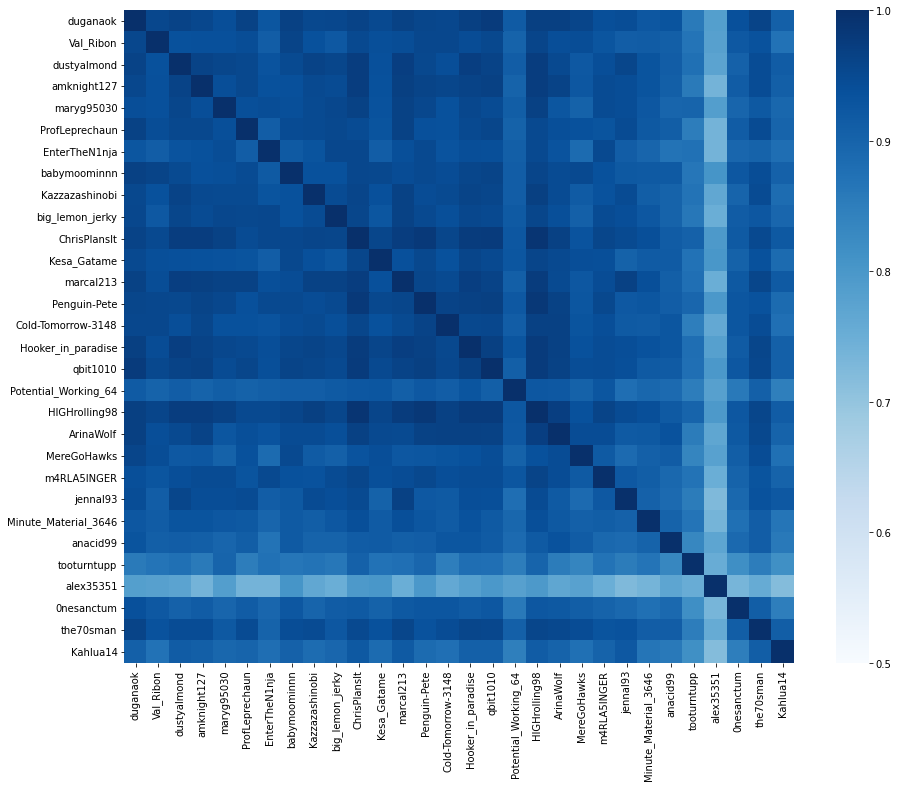

In [90]:
heatplot(dataframe, dataframe, cosine_similarity)

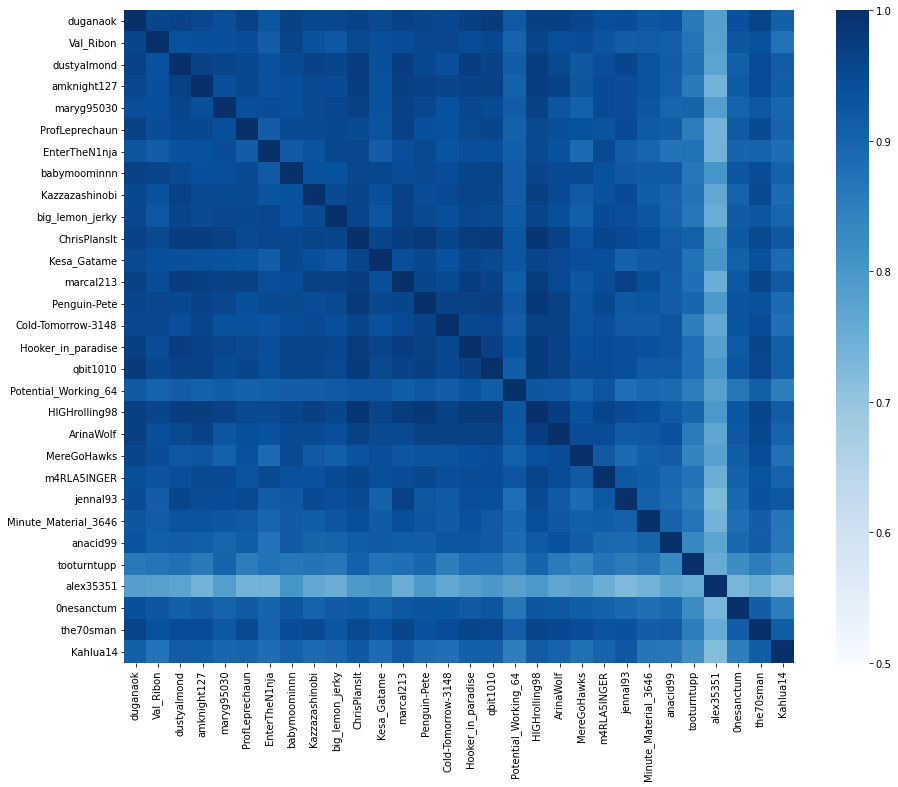

In [92]:
plt.figure(figsize=(15, 12))
sns.heatmap(dataframe.corr(),annot=False,vmin=0.5, vmax=1, cmap='Blues');


## Topic modeling for user 'Scizmz'



In [93]:
!pip install pyldavis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 5.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyldavis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=86a7d49802bc16d319c059a8c5021bcdf1a4c6ac6188a380c151ccb69c5fefa7
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyldavis


In [94]:
from collections import defaultdict, Counter
from sklearn.feature_extraction.text import TfidfVectorizer
import random
from community import community_louvain
import matplotlib.cm as cm
from datetime import datetime
from datetime import date
import datetime as dt
import seaborn as sns
from scipy import stats
from scipy.stats import pearsonr
import spacy
spacy.prefer_gpu()
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import re
# from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import statsmodels.api as sm
import statsmodels.formula.api as smf
from gensim.models import TfidfModel

# LDA Topic modeling
import json
import glob
#Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
#nltk
import nltk
from nltk.corpus import stopwords
#vis
import pyLDAvis
import pyLDAvis.gensim_models as gensim_models
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


In [105]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [97]:
all_direct_graph[13].edges('Scizmz')

OutEdgeDataView([('Scizmz', 'jud50'), ('Scizmz', 'pluvialweb'), ('Scizmz', 'privateimac'), ('Scizmz', 'Dooleyisntcool'), ('Scizmz', 'Realistic_Yogurt_950'), ('Scizmz', 'driftykitten'), ('Scizmz', 'beanston'), ('Scizmz', 'scrubling'), ('Scizmz', 'Careless-Diamond-970'), ('Scizmz', 'LukeFromStarWars'), ('Scizmz', 'Aggravating-Golf-466'), ('Scizmz', 'alex35351'), ('Scizmz', 'ChelleCain'), ('Scizmz', 'iiiiiii-0'), ('Scizmz', 'ismaithliombia'), ('Scizmz', 'VelmaJ2233')])

In [98]:
example_dic = {}
for commenter, poster in all_direct_graph[13].edges('Scizmz'):
  for k,v in dic_all.items():
    if poster == v["post author"] and commenter in v['comments author']:
      print(k)
      for kc, vc in wfh_comments.items():
        if k in vc['topic_link'] and vc['author'] == commenter:
          print(1)
          if poster not in example_dic.keys():
            example_dic[poster] = {}
            example_dic[poster]['answer'] = []
          # example_dic[commenter] += ' '
          example_dic[poster]['answer'] += [vc['comments']]
          example_dic[poster]['question'] = v['texts']
         

/r/workfromhome/comments/rjou6a/noise_suppression_calls/
1
/r/workfromhome/comments/rirfrk/how_can_my_bf_and_i_share_our_desk/
1
/r/workfromhome/comments/rdio7s/sitting_at_desk_too_long/
1
/r/workfromhome/comments/qz2gbz/best_jobs_with_no_experience/
1
/r/workfromhome/comments/qxzqw8/im_so_over_people_saying_wfh_is_easy/
1
1
1
/r/workfromhome/comments/quhh61/just_wondering_if_its_considered_rude_to_mute/
1
/r/workfromhome/comments/qbghdc/cannot_do_my_job_to_save_my_life/
1
/r/workfromhome/comments/pxy4bf/looking_for_a_desk_clamp_that_can_hold_a_laptop/
1
/r/workfromhome/comments/pwxbl1/is_anyone_else_lonely_and_depressed_af/
1
/r/workfromhome/comments/pkyz7u/i_accidentally_turned_the_camera_on_for_2_seconds/
1
/r/workfromhome/comments/phxyso/help_me_with_this_wfh_dilemma/
1
/r/workfromhome/comments/p06b6d/how_do_you_stay_productive_and_stop/
1
/r/workfromhome/comments/olt410/so_i_wfh_but_recently_got_a_job_offer_but_my/
1
1
/r/workfromhome/comments/o17rg1/does_anyone_else_feel_like_95_

In [99]:
example_dic 

{'Aggravating-Golf-466': {'answer': ['Work from a different office. Be it a local coffee shop or a shared office. Some people I know have built small sheds converted to offices in their back yards. What is it that you\'re looking at getting out of from working "from the office"? Is it just human interaction? Go drive uber for an hour or two a day. Is it bonding with co-workers? That\'s the one that will require you to do the hard part. Either way there are easier ways to go about doing anything else other than packing up and moving.'],
  'question': "Help me with this WFH dilemma? It's been a year I've been working as a Management Consultant. Due to Covid, I have been working primarily from home. It has gotten to me lately. I feel suffocated staying all day home in front of the laptop. I would like to go to the office instead. But for me to go to the office, I'll have to move to another city and pay rent. So on one hand WFH is not letting me enjoy my work and on the other I won't save 

In [100]:

def lemmatization(texts, allowed_postags=["NOUN", "ADJ", "VERB", "ADV"]):
    nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
    texts_out = []
    raw_texts = []
    for text in texts:
        raw_texts.append(text)
        doc = nlp(text)
        new_text = []
        for token in doc:
            if token.pos_ in allowed_postags:
                new_text.append(token.lemma_)
        final = " ".join(new_text)
        final = re.sub('https?:[^\s]+', '', final)
        texts_out.append(final)
    return texts_out,raw_texts
def gen_words(texts):
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text, deacc=True)
        final.append(new)
    return (final)
def make_bigrams(texts):
    return([bigram21[doc] for doc in texts])

def make_trigrams(texts):
    return ([trigram21[bigram21[doc]] for doc in texts])
# stopwords = stopwords.words("english")
word_lst = ['get','just','go','so','do','take','make','give','vs','also','let','th','amp','etc','ve',"seem", "think","look","thing","else","already","turn","way","see","say","one","come","bit","actually","set","put","sure","lot","even","maybe","whole","ensure","co"]



In [101]:
# Select variables that I want related to the posts: time, text, date
def get_contents(sub):
    
    result_dic = {}
    
    filename = "{1}/{0}/{1}_jsonlists.gz".format(sub, 'posts')
    
    i = 0
    
    for dic in read_json_list(filename):
            result = {}
            if 'selftext' in dic:
                title = dic['title']
                text = dic['selftext']
                subreddit = dic['subreddit']
                created_time = dic['created_utc']   
                if text != '[removed]'and text !='[deleted]':
                    result['text'] = title+' '+text 
                    result['time'] = datetime.utcfromtimestamp(created_time).strftime('%Y-%m-%d %H:%M:%S')
                    result['date'] = result['time'][:10]
                    result_dic[i] = result
                    i += 1
    print(i)
    return result_dic

In [102]:
workfromhome21 = get_contents('WorkFromHome21')

3016


In [108]:
stop_words = set(stopwords.words("english"))

In [110]:
len(stop_words)

179

In [111]:
workfromhome2021 = []
for k,v in workfromhome21.items():
    workfromhome2021.append(v['text'])
    
lemmatized_texts21, raw_texts21 = lemmatization(workfromhome2021)
data_words21 = gen_words(lemmatized_texts21)

#BIGRAMS AND TRIGRAMS
bigram_phrases21 = gensim.models.Phrases(data_words21, min_count=5, threshold=30)
trigram_phrases21 = gensim.models.Phrases(bigram_phrases21[data_words21], threshold=30)

bigram21 = gensim.models.phrases.Phraser(bigram_phrases21)
trigram21 = gensim.models.phrases.Phraser(trigram_phrases21)

def make_bigrams(texts):
    return([bigram21[doc] for doc in texts])

def make_trigrams(texts):
    return ([trigram21[bigram21[doc]] for doc in texts])

data_bigrams21 = make_bigrams(data_words21)
data_bigrams_trigrams21 = make_trigrams(data_bigrams21)

new_data_bigrams_trigrams21 = []
for lst in data_bigrams_trigrams21:
    new_lst = []
    for i in lst:
        if i not in word_lst and i not in stop_words:
            if i == 'coronavirus' or i == 'pandemic':
                new_lst.append('covid')
            elif i == 'workfromhome':
                new_lst.append('wfh')
            elif i == 'remotely':
                new_lst.append('remote')
            elif i == 'stand_desk':
                new_lst.append('standing_desk')
            else:
                new_lst.append(i)
    new_data_bigrams_trigrams21.append(new_lst)
    
data_bigrams_trigrams21 = new_data_bigrams_trigrams21


id2word21 = corpora.Dictionary(data_bigrams_trigrams21)
texts21 = data_bigrams_trigrams21
corpus21 = [id2word21.doc2bow(text) for text in texts21]

lda_model21 = gensim.models.ldamodel.LdaModel(corpus=corpus21,
                                           id2word=id2word21,
                                           num_topics=8,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto")

pyLDAvis.enable_notebook()
vis21 = gensim_models.prepare(lda_model21, corpus21, id2word21, mds="mmds", R=30)
vis21

/usr/local/lib/python3.7/dist-packages/gensim/models/phrases.py:598: UserWarning: For a faster implementation, use the gensim.models.phrases.Phraser class
  warnings.warn("For a faster implementation, use the gensim.models.phrases.Phraser class")
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.126690  0.405319       1        1  26.236316
0     -0.374252  0.108888       2        1  22.586440
1     -0.044168  0.149217       3        1  18.251324
7      0.353097 -0.027918       4        1   8.984284
5     -0.287206 -0.234243       5        1   7.025662
4      0.231843 -0.303088       6        1   6.960076
3      0.280338  0.240257       7        1   5.370201
6     -0.032962 -0.338431       8        1   4.585698, topic_info=             Term         Freq        Total Category  logprob  loglift
15           work  3973.000000  3973.000000  Default  30.0000  30.0000
6            home  2335.000000  2335.000000  Default  29.0000  29.0000
64            job  1821.000000  1821.000000  Default  28.0000  28.0000
1620       search   315.000000   315.000000  Default  27.0000  27.0000
386        remote   712.000000   712.000000  Default  26.0000  26.0000
...           ...          ...          ...      ...      ...      ...
6508   delegation    25.930109    27.120535   Topic8  -5.0319   3.0373
463      employee   174.253320   191.694081   Topic8  -3.1268   2.9868
1339  environment    29.480038    38.496142   Topic8  -4.9036   2.8154
740          tool    25.529543    47.406661   Topic8  -5.0475   2.4633
374       student    24.287361    61.454745   Topic8  -5.0973   2.1539

[363 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
445       1  0.874757        able
445       3  0.120438        able
1058      5  0.986516    activity
205       5  0.975781          ad
835       2  0.993572         add
...     ...       ...         ...
391       2  0.102156  would_like
257       1  0.988136       write
524       1  0.157748        year
524       2  0.628363        year
524       3  0.212960        year

[419 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 2, 8, 6, 5, 4, 7])

In [112]:
posters_lst = []
for k1,v1 in workfromhome21.items():
  for k2,v2 in example_dic.items():
    if v2["question"] == v1['text']:
      posters_lst.append(k1)
      

In [113]:
posters_lst

[85,
 94,
 153,
 340,
 349,
 396,
 666,
 890,
 912,
 1084,
 1123,
 1370,
 1534,
 1757,
 2264,
 2998]

In [114]:
lda_model21[corpus21[153]]

[(0, 0.0954705),
 (1, 0.44140536),
 (2, 0.14414594),
 (3, 0.026255196),
 (4, 0.029472427),
 (5, 0.065174535),
 (6, 0.019387472),
 (7, 0.17868857)]

In [115]:
for i in posters_lst:
  print(sorted(lda_model21[corpus21[i]], key=lambda item: item[1],reverse=True)[0])


(3, 0.31879297)
(1, 0.34324646)
(1, 0.44143134)
(0, 0.37732142)
(2, 0.50547546)
(5, 0.3369504)
(1, 0.3318277)
(7, 0.45256856)
(2, 0.4438528)
(2, 0.27871156)
(2, 0.4736824)
(2, 0.38993382)
(0, 0.36055475)
(1, 0.34014544)
(1, 0.5523315)
(2, 0.38478324)


In [116]:
print(lda_model21.print_topics(num_words=5)) 

[(0, '0.093*"job" + 0.034*"remote" + 0.030*"find" + 0.029*"company" + 0.023*"know"'), (1, '0.024*"back" + 0.022*"want" + 0.022*"start" + 0.018*"try" + 0.015*"office"'), (2, '0.172*"work" + 0.103*"home" + 0.023*"day" + 0.023*"time" + 0.019*"people"'), (3, '0.068*"search" + 0.028*"call" + 0.025*"hear" + 0.022*"roamingdesk" + 0.021*"phone"'), (4, '0.033*"employer" + 0.028*"business" + 0.026*"study" + 0.021*"send" + 0.017*"link"'), (5, '0.032*"video" + 0.028*"use" + 0.028*"team" + 0.027*"website" + 0.026*"earn"'), (6, '0.044*"employee" + 0.029*"project" + 0.024*"research" + 0.023*"site" + 0.023*"information"'), (7, '0.038*"use" + 0.033*"desk" + 0.029*"laptop" + 0.019*"space" + 0.017*"monitor"')]
